# Lead Scoring Case Study

## Problem Statement

An education company named X Education sells online courses to industry professionals. On any given day, many professionals who are interested in the courses land on their website and browse for courses. 

The company markets its courses on several websites and search engines like Google. Once these people land on the website, they might browse the courses or fill up a form for the course or watch some videos. When these people fill up a form providing their email address or phone number, they are classified to be a lead. Moreover, the company also gets leads through past referrals. Once these leads are acquired, employees from the sales team start making calls, writing emails, etc. Through this process, some of the leads get converted while most do not. The typical lead conversion rate at X education is around 30%. 

Now, although X Education gets a lot of leads, its lead conversion rate is very poor. For example, if, say, they acquire 100 leads in a day, only about 30 of them are converted. To make this process more efficient, the company wishes to identify the most potential leads, also known as ‘Hot Leads’. If they successfully identify this set of leads, the lead conversion rate should go up as the sales team will now be focusing more on communicating with the potential leads rather than making calls to everyone.

A typical lead conversion process can be represented using the following funnel:

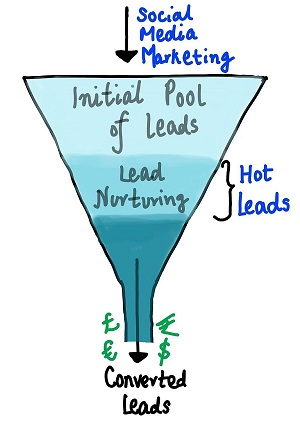

As we can see, there are a lot of leads generated in the initial stage (top) but only a few of them come out as paying customers from the bottom. In the middle stage, you need to nurture the potential leads well (i.e. educating the leads about the product, constantly communicating etc. ) in order to get a higher lead conversion.

X Education has appointed us to help them select the most promising leads, i.e. the leads that are most likely to convert into paying customers. The company requires us to build a model wherein we need to assign a lead score to each of the leads such that the customers with a higher lead score have a higher conversion chance and the customers with a lower lead score have a lower conversion chance. The CEO, in particular, has given a ballpark of the target lead conversion rate to be around 80%.

## Goals of the Case Study

The goals for this case study are as follows:

1. Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the    company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.
    
2. There are some more problems presented by the company which your model should be able to adjust to if the company's requirement changes in the future so you will need to handle these as well. 

3. We also need to make recommendations based on the logistic regression model.

## Data

We have been provided with a leads dataset from the past with around 9000 data points. This dataset consists of various attributes such as Lead Source, Total Time Spent on Website, Total Visits, Last Activity, etc. which may or may not be useful in ultimately deciding whether a lead will be converted or not. 

The target variable, in this case study, is the column ‘Converted’ which tells whether a past lead was converted or not wherein 1 means it was converted and 0 means it wasn’t converted. 


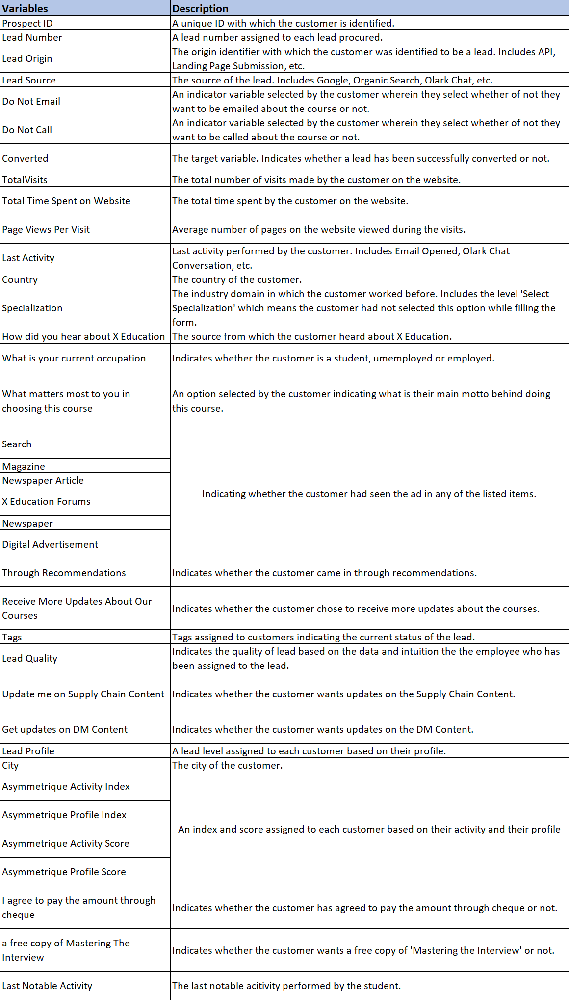

## Importing Libraries

In [6]:
## Import Warnings
import warnings
warnings.filterwarnings('ignore')

In [7]:
## importing the libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve

In [8]:
# Setting display options and customizations
%matplotlib inline
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', 30)
plt.style.use('seaborn-notebook')

In [9]:
#constants
perc = 100
decimal_point = 4

## Data Preparation, Cleaning and EDA

### Step 1: Importing Data

In [10]:
## Reading the data set from csv file
leads = pd.read_csv("Leads.csv")

In [11]:
## Displaying the data
leads.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6...,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dc...,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fd...,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading ...,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19...,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a...,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading ...,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


### Step 2: Inspecting the Dataframe

In [12]:
## Dimensions of dataframe
leads.shape

(9240, 37)

`There are 9240 rows and 37 columns in the dataframe`

In [13]:
## Datatype Analysis
leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

`There are 30 categorical and 7 numeric columns in the dataframe.`

In [14]:
## Statistical Analysis of Numerical variables in Dataframe
leads.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


### Step 3: Data Cleaning

In [15]:
## Getting Unique values counts for the variables
leads.nunique().sort_values()

Get updates on DM Content                           1
I agree to pay the amount through cheque            1
Receive More Updates About Our Courses              1
Magazine                                            1
Update me on Supply Chain Content                   1
Through Recommendations                             2
Digital Advertisement                               2
Newspaper                                           2
X Education Forums                                  2
A free copy of Mastering The Interview              2
Search                                              2
Newspaper Article                                   2
Converted                                           2
Do Not Call                                         2
Do Not Email                                        2
What matters most to you in choosing a course       3
Asymmetrique Activity Index                         3
Asymmetrique Profile Index                          3
Lead Origin                 

In [16]:
## For the variables having value count as 1
for col in ['Get updates on DM Content','I agree to pay the amount through cheque','Receive More Updates About Our Courses','Magazine','Update me on Supply Chain Content']:
    print(leads[col].value_counts())

No    9240
Name: Get updates on DM Content, dtype: int64
No    9240
Name: I agree to pay the amount through cheque, dtype: int64
No    9240
Name: Receive More Updates About Our Courses, dtype: int64
No    9240
Name: Magazine, dtype: int64
No    9240
Name: Update me on Supply Chain Content, dtype: int64


In [17]:
## Removing the columns having value counts = 1 as they have constant value for each record
leads.drop(columns = ['Get updates on DM Content','I agree to pay the amount through cheque','Receive More Updates About Our Courses','Magazine','Update me on Supply Chain Content'], inplace=True)

In [18]:
leads.shape

(9240, 32)

In [19]:
## Check for duplicates in prospect id column
sum(leads.duplicated(subset = 'Prospect ID'))

0

In [20]:
## Check for duplicates in Lead Number column
sum(leads.duplicated(subset = 'Lead Number'))

0

In [21]:
## Both Lead Number and Prospect Id columns are uniques identifiers for each lead. 
## They don't add much value to the model. Hence, dropping these columns as well
leads.drop(columns = ['Prospect ID','Lead Number'], inplace=True)

In [22]:
leads.shape

(9240, 30)

#### Handling Missing Values

In [23]:
## Null Values Analysis
leads_null = leads.isnull().sum()
leads_null[leads.isnull().sum() > 0]

Lead Source                                        36
TotalVisits                                       137
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Tags                                             3353
Lead Quality                                     4767
Lead Profile                                     2709
City                                             1420
Asymmetrique Activity Index                      4218
Asymmetrique Profile Index                       4218
Asymmetrique Activity Score                      4218
Asymmetrique Profile Score                       4218
dtype: int64

In [24]:
## Null Values Percentage Analysis
leads_null_perc=(round(leads_null[leads.isnull().sum() > 0]/len(leads.index),decimal_point)*perc).sort_values(ascending = False)
leads_null_perc

Lead Quality                                     51.59
Asymmetrique Profile Score                       45.65
Asymmetrique Activity Score                      45.65
Asymmetrique Profile Index                       45.65
Asymmetrique Activity Index                      45.65
Tags                                             36.29
Lead Profile                                     29.32
What matters most to you in choosing a course    29.32
What is your current occupation                  29.11
Country                                          26.63
How did you hear about X Education               23.89
Specialization                                   15.56
City                                             15.37
TotalVisits                                       1.48
Page Views Per Visit                              1.48
Last Activity                                     1.11
Lead Source                                       0.39
dtype: float64

In [25]:
leads_null_perc.describe()

count    17.000000
mean     26.125882
std      17.750624
min       0.390000
25%      15.370000
50%      29.110000
75%      45.650000
max      51.590000
dtype: float64

In [26]:
leads_null_perc.quantile([0.8,0.9,0.99])

0.80    45.6500
0.90    45.6500
0.99    50.6396
dtype: float64

`After analysing the null value percentage of all columns present in Leads Data, 75 percentile of columns have null percentage less than 45%.  Remaining 25 percentile columns have more than 45% of null values.` 

In [27]:
leads_null_45 = leads_null_perc[leads_null_perc>45.00]

In [28]:
#number of columns having null values greater than 45%
leads_null_45.size

5

In [29]:
#dropping the columns having null values greater than 45%
leads.drop(columns = list(leads_null_45.index), inplace=True)

In [30]:
leads.shape

(9240, 25)

`Analysing the Null Values in Dataframe after dropping columns having null values greater than 45%`

In [31]:
## Null Values Percentage Analysis after dropping columns
leads_null = leads.isnull().sum()
leads_null[leads.isnull().sum() > 0]
leads_null_perc=(round(leads_null[leads.isnull().sum() > 0]/len(leads.index),decimal_point)*perc).sort_values(ascending = False)
leads_null_perc

Tags                                             36.29
What matters most to you in choosing a course    29.32
Lead Profile                                     29.32
What is your current occupation                  29.11
Country                                          26.63
How did you hear about X Education               23.89
Specialization                                   15.56
City                                             15.37
TotalVisits                                       1.48
Page Views Per Visit                              1.48
Last Activity                                     1.11
Lead Source                                       0.39
dtype: float64

In [32]:
## Tags Column Analysis
leads.Tags.value_counts(dropna = False)

NaN                                                  3353
Will revert after reading the email                  2072
Ringing                                              1203
Interested in other courses                           513
Already a student                                     465
Closed by Horizzon                                    358
switched off                                          240
Busy                                                  186
Lost to EINS                                          175
Not doing further education                           145
Interested  in full time MBA                          117
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    27
in touch with 

In [33]:
## Imputting Values - replacing the NaN values with Unknown as value
leads['Tags'].fillna(('Unknown'), inplace=True)

In [34]:
## Values after Missing value imputation
leads.Tags.value_counts(dropna=False)

Unknown                                              3353
Will revert after reading the email                  2072
Ringing                                              1203
Interested in other courses                           513
Already a student                                     465
Closed by Horizzon                                    358
switched off                                          240
Busy                                                  186
Lost to EINS                                          175
Not doing further education                           145
Interested  in full time MBA                          117
Graduation in progress                                111
invalid number                                         83
Diploma holder (Not Eligible)                          63
wrong number given                                     47
opp hangup                                             33
number not provided                                    27
in touch with 

In [35]:
## Analysis for 'What matters most to you in choosing a course' Column
leads['What matters most to you in choosing a course'].value_counts(dropna=False)

Better Career Prospects      6528
NaN                          2709
Flexibility & Convenience       2
Other                           1
Name: What matters most to you in choosing a course, dtype: int64

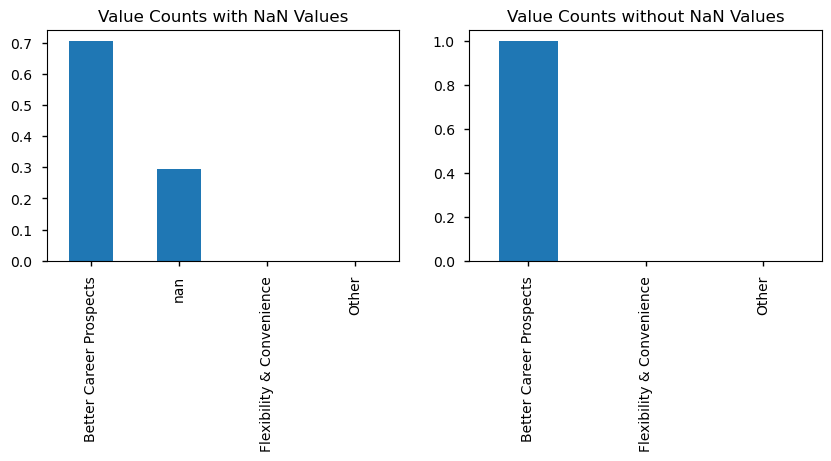

In [36]:
plt.figure(figsize = [10,3])
plt.subplot(1,2,1)
plt.title('Value Counts with NaN Values')
leads['What matters most to you in choosing a course'].value_counts(normalize=True,dropna=False).plot.bar()
plt.subplot(1,2,2)
plt.title('Value Counts without NaN Values')
leads['What matters most to you in choosing a course'].value_counts(normalize=True).plot.bar()
plt.show()

`For 'What matters most to you in choosing a course' column, majority of the values are "Better Career Prospects". This column does not add much value as the out of available data as for non-null data 99.99% values are same value i.e., "Better Career Prospects". Thus dropping this column`

In [37]:
leads.drop(columns='What matters most to you in choosing a course',inplace=True)

In [38]:
leads.shape

(9240, 24)

In [39]:
## Analysis for Lead Profile
leads['Lead Profile'].value_counts(dropna=False)

Select                         4146
NaN                            2709
Potential Lead                 1613
Other Leads                     487
Student of SomeSchool           241
Lateral Student                  24
Dual Specialization Student      20
Name: Lead Profile, dtype: int64

In [40]:
## For the column Lead profile - We don't know values for both Select and Nan
## Mapping values of Select as Unknown and also filling NaN values as Unknown.
leads['Lead Profile'].fillna(('Unknown'), inplace=True)
leads['Lead Profile'].replace(to_replace = 'Select', value = 'Unknown', inplace = True)

In [41]:
## Analysis after Select Value and NaN Value replacement
leads['Lead Profile'].value_counts(dropna=False)

Unknown                        6855
Potential Lead                 1613
Other Leads                     487
Student of SomeSchool           241
Lateral Student                  24
Dual Specialization Student      20
Name: Lead Profile, dtype: int64

In [42]:
## Analysis for column What is your current occupation
leads['What is your current occupation'].value_counts(dropna=False)

Unemployed              5600
NaN                     2690
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64

In [43]:
## Filling Missing Null Values
leads['What is your current occupation'].fillna(('Unknown'), inplace=True)

In [44]:
## Analysis after Missing Value Imputation
leads['What is your current occupation'].value_counts(dropna=False)

Unemployed              5600
Unknown                 2690
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: What is your current occupation, dtype: int64

In [45]:
## Analysis for column Country  
leads['Country'].value_counts(dropna=False)

India                   6492
NaN                     2461
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Bahrain                    7
Hong Kong                  7
Oman                       6
France                     6
unknown                    5
Kuwait                     4
South Africa               4
Canada                     4
Nigeria                    4
Germany                    4
Sweden                     3
Philippines                2
Uganda                     2
Italy                      2
Bangladesh                 2
Netherlands                2
Asia/Pacific Region        2
China                      2
Belgium                    2
Ghana                      2
Kenya                      1
Sri Lanka                  1
Tanzania                   1
Malaysia                   1
Liberia                    1
Switzerland   

In [46]:
## Filling Missing Null Values
leads['Country'].fillna(('Unknown'), inplace=True)

In [47]:
## Analysis after Missing Value Imputation
leads['Country'].value_counts(dropna=False)

India                   6492
Unknown                 2461
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Bahrain                    7
Hong Kong                  7
Oman                       6
France                     6
unknown                    5
Kuwait                     4
South Africa               4
Canada                     4
Nigeria                    4
Germany                    4
Sweden                     3
Philippines                2
Uganda                     2
Italy                      2
Bangladesh                 2
Netherlands                2
Asia/Pacific Region        2
China                      2
Belgium                    2
Ghana                      2
Kenya                      1
Sri Lanka                  1
Tanzania                   1
Malaysia                   1
Liberia                    1
Switzerland   

In [48]:
## Analysis for How did you hear about X Education Column
leads['How did you hear about X Education'].value_counts(dropna=False)

Select                   5043
NaN                      2207
Online Search             808
Word Of Mouth             348
Student of SomeSchool     310
Other                     186
Multiple Sources          152
Advertisements             70
Social Media               67
Email                      26
SMS                        23
Name: How did you hear about X Education, dtype: int64

In [49]:
## For the column How did you hear about X Education - We don't know values for both Select and Nan
## Mapping values of Select as Unknown and also filling NaN values as Unknown.
leads['How did you hear about X Education'].fillna(('Unknown'), inplace=True)
leads['How did you hear about X Education'].replace(to_replace = 'Select', value = 'Unknown', inplace = True)

In [50]:
## Analysis after Select Value and NaN Value replacement
leads['How did you hear about X Education'].value_counts(dropna=False)

Unknown                  7250
Online Search             808
Word Of Mouth             348
Student of SomeSchool     310
Other                     186
Multiple Sources          152
Advertisements             70
Social Media               67
Email                      26
SMS                        23
Name: How did you hear about X Education, dtype: int64

In [51]:
## Analysis for Column Specialization
leads['Specialization'].value_counts(dropna=False)

Select                               1942
NaN                                  1438
Finance Management                    976
Human Resource Management             848
Marketing Management                  838
Operations Management                 503
Business Administration               403
IT Projects Management                366
Supply Chain Management               349
Banking, Investment And Insurance     338
Travel and Tourism                    203
Media and Advertising                 203
International Business                178
Healthcare Management                 159
Hospitality Management                114
E-COMMERCE                            112
Retail Management                     100
Rural and Agribusiness                 73
E-Business                             57
Services Excellence                    40
Name: Specialization, dtype: int64

In [52]:
## For the column Specialization - We don't know values for both Select and Nan
## Mapping values of Select as Unknown and also filling NaN values as Unknown.
leads['Specialization'].replace(to_replace = ['Select',np.nan] , value = 'Unknown', inplace = True)

In [53]:
## Analysis after Select Value and NaN Value replacement
leads['Specialization'].value_counts(dropna=False)

Unknown                              3380
Finance Management                    976
Human Resource Management             848
Marketing Management                  838
Operations Management                 503
Business Administration               403
IT Projects Management                366
Supply Chain Management               349
Banking, Investment And Insurance     338
Travel and Tourism                    203
Media and Advertising                 203
International Business                178
Healthcare Management                 159
Hospitality Management                114
E-COMMERCE                            112
Retail Management                     100
Rural and Agribusiness                 73
E-Business                             57
Services Excellence                    40
Name: Specialization, dtype: int64

In [54]:
## Analysis for column City
leads['City'].value_counts(dropna=False)

Mumbai                         3222
Select                         2249
NaN                            1420
Thane & Outskirts               752
Other Cities                    686
Other Cities of Maharashtra     457
Other Metro Cities              380
Tier II Cities                   74
Name: City, dtype: int64

In [55]:
## For the column City - We don't know values for both Select and Nan
## Mapping values of Select as Unknown and also filling NaN values as Unknown.
leads['City'].replace(to_replace = ['Select',np.nan] , value = 'Unknown', inplace = True)

In [56]:
## Analysis after Select Value and NaN Value replacement
leads['City'].value_counts(dropna=False)

Unknown                        3669
Mumbai                         3222
Thane & Outskirts               752
Other Cities                    686
Other Cities of Maharashtra     457
Other Metro Cities              380
Tier II Cities                   74
Name: City, dtype: int64

In [57]:
## Analysis for Column Total Visits
leads['TotalVisits'].value_counts(dropna=False)

0.0      2189
2.0      1680
3.0      1306
4.0      1120
5.0       783
6.0       466
1.0       395
7.0       309
8.0       224
9.0       164
NaN       137
10.0      114
11.0       86
13.0       48
12.0       45
14.0       36
16.0       21
15.0       18
17.0       16
18.0       15
20.0       12
19.0        9
21.0        6
23.0        6
24.0        5
25.0        5
27.0        5
22.0        3
29.0        2
28.0        2
26.0        2
141.0       1
55.0        1
30.0        1
43.0        1
74.0        1
41.0        1
54.0        1
115.0       1
251.0       1
32.0        1
42.0        1
Name: TotalVisits, dtype: int64

In [58]:
## Filling Missing Null Values with Median for TotalVisits Column
leads['TotalVisits'].fillna((leads['TotalVisits'].median()), inplace=True)

In [59]:
## Analysis after NaN Value Imputation
leads['TotalVisits'].isnull().sum()

0

In [60]:
## Analysis for Page Views Per Visit Column
leads['Page Views Per Visit'].value_counts(dropna=False)

0.00    2189
2.00    1795
3.00    1196
4.00     896
1.00     651
        ... 
2.56       1
6.33       1
1.64       1
8.21       1
2.08       1
Name: Page Views Per Visit, Length: 115, dtype: int64

In [61]:
## Filling Missing Null Values with Median for Page Views Per Visit Column
leads['Page Views Per Visit'].fillna((leads['Page Views Per Visit'].median()), inplace=True)

In [62]:
## Analysis after NaN Value Imputation
leads['Page Views Per Visit'].isnull().sum()

0

In [63]:
## Analysis for Last Activity Columnn
leads['Last Activity'].value_counts(dropna=False)

Email Opened                    3437
SMS Sent                        2745
Olark Chat Conversation          973
Page Visited on Website          640
Converted to Lead                428
Email Bounced                    326
Email Link Clicked               267
Form Submitted on Website        116
NaN                              103
Unreachable                       93
Unsubscribed                      61
Had a Phone Conversation          30
Approached upfront                 9
View in browser link Clicked       6
Email Received                     2
Email Marked Spam                  2
Visited Booth in Tradeshow         1
Resubscribed to emails             1
Name: Last Activity, dtype: int64

In [64]:
## Imputing Null Values by Unknown
leads['Last Activity'].fillna(('Unknown'), inplace=True)

In [65]:
## Analysis after Null Value Imputation
leads['Last Activity'].value_counts(dropna=False)

Email Opened                    3437
SMS Sent                        2745
Olark Chat Conversation          973
Page Visited on Website          640
Converted to Lead                428
Email Bounced                    326
Email Link Clicked               267
Form Submitted on Website        116
Unknown                          103
Unreachable                       93
Unsubscribed                      61
Had a Phone Conversation          30
Approached upfront                 9
View in browser link Clicked       6
Email Received                     2
Email Marked Spam                  2
Visited Booth in Tradeshow         1
Resubscribed to emails             1
Name: Last Activity, dtype: int64

In [66]:
## Analysis for Column Lead Source
leads['Lead Source'].value_counts(dropna=False)

Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
NaN                    36
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: Lead Source, dtype: int64

In [67]:
## For the Lead Source column, we can observe that we have 'Google' and 'google' as values. This needs to be synced
## Also, imputing NaN values by Mode as the Null Value% is very Low
leads['Lead Source'].replace(to_replace = ['google',np.nan] , value = 'Google', inplace = True)

In [68]:
## Analysis after Value Replacement and Imputation
leads['Lead Source'].value_counts(dropna=False)

Google               2909
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
Click2call              4
Social Media            2
Live Chat               2
Press_Release           2
Pay per Click Ads       1
blog                    1
WeLearn                 1
welearnblog_Home        1
youtubechannel          1
testone                 1
NC_EDM                  1
Name: Lead Source, dtype: int64

In [69]:
## Null Values Percentage Analysis after Value Imputation
leads_null = leads.isnull().sum()
leads_null[leads.isnull().sum() > 0]
leads_null_perc=(round(leads_null[leads.isnull().sum() > 0]/len(leads.index),decimal_point)*perc).sort_values(ascending = False)
leads_null_perc

Series([], dtype: float64)

`NaN values have been handled in the dataframe`

In [70]:
## Dimensions after Data Cleaning
leads.shape

(9240, 24)

In [71]:
leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 24 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Lead Origin                             9240 non-null   object 
 1   Lead Source                             9240 non-null   object 
 2   Do Not Email                            9240 non-null   object 
 3   Do Not Call                             9240 non-null   object 
 4   Converted                               9240 non-null   int64  
 5   TotalVisits                             9240 non-null   float64
 6   Total Time Spent on Website             9240 non-null   int64  
 7   Page Views Per Visit                    9240 non-null   float64
 8   Last Activity                           9240 non-null   object 
 9   Country                                 9240 non-null   object 
 10  Specialization                          9240 non-null   obje

In [72]:
leads.head()

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity
0,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,Unknown,Unknown,Unknown,Unemployed,No,No,No,No,No,No,Interested in other courses,Unknown,Unknown,No,Modified
1,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Unknown,Unknown,Unemployed,No,No,No,No,No,No,Ringing,Unknown,Unknown,No,Email Opened
2,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Unknown,Student,No,No,No,No,No,No,Will revert after reading ...,Potential Lead,Mumbai,Yes,Email Opened
3,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,No,No,No,No,No,No,Ringing,Unknown,Mumbai,No,Modified
4,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Unknown,Other,Unemployed,No,No,No,No,No,No,Will revert after reading ...,Unknown,Mumbai,No,Modified


### Step 4: Univariate Analysis

#### Converted is the target variable which tells whether the leads are converted (1) or not(0)


In [73]:
## Target Variable Analysis
leads['Converted'].value_counts()

0    5679
1    3561
Name: Converted, dtype: int64

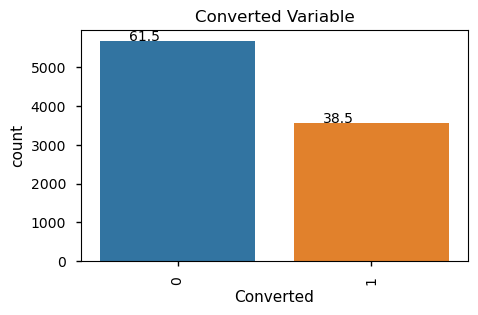

In [74]:
## plotting the graph
plt.figure(figsize=[5,3])
ax = sns.countplot(leads['Converted'])
plt.title('Converted Variable')
for val in ax.patches:
    ax.annotate('{}'.format(round(val.get_height()/leads['Converted'].size*perc,1)),(val.get_x()+0.15, val.get_height()+1))
plt.xticks(rotation=90)
plt.show()

#### Inferences from the graph
 - As we can see from the graph , 38.5% conversion happened 
 - The leads which were not able to convert were 61.5% of the entire data.

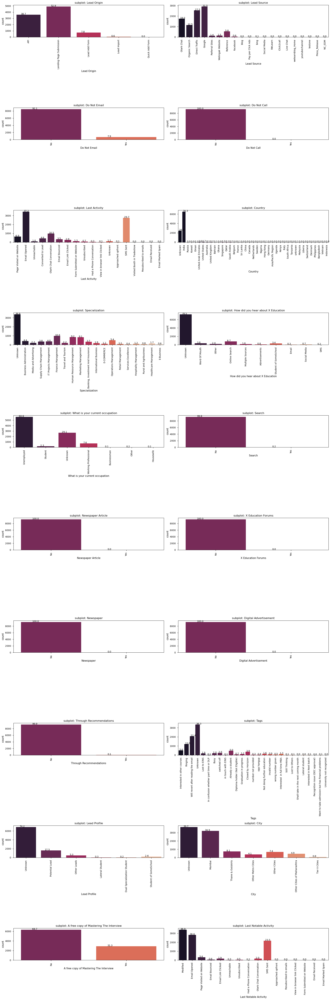

In [75]:
# Columns having Object DataType
a = 10  # number of rows
b = 2  # number of columns
c = 1 

fig = plt.figure(figsize=(20,60))
for col in leads.columns:
    if leads[col].dtypes=="object":
        plt.subplot(a, b, c)
        plt.title('subplot: {}'.format(col))
        ax = sns.countplot(leads[col],palette="rocket")       
        plt.xticks(rotation=90)
        for val in ax.patches:
            ax.annotate('{}'.format(round(val.get_height()/leads[col].size*perc,1)),(val.get_x()+0.15, val.get_height()+1))
        c = c + 1
        
fig.tight_layout()
plt.show()

The following columns have highly skewed data and have constant values almost across all rows:
 - Through Recommendations
 - Digital Advertisement
 - Newspaper
 - Newspaper Article
 - X Education Forums
 - Search
 - Do not Call
 - Do not Email
 
We can drop these columns as they will not add much value to the model

In [76]:
col_drop=['Through Recommendations','Digital Advertisement','Newspaper','Newspaper Article','X Education Forums','Search','Do Not Email','Do Not Call']

In [77]:
leads.drop(columns=col_drop,inplace=True)

#### Outlier Analysis

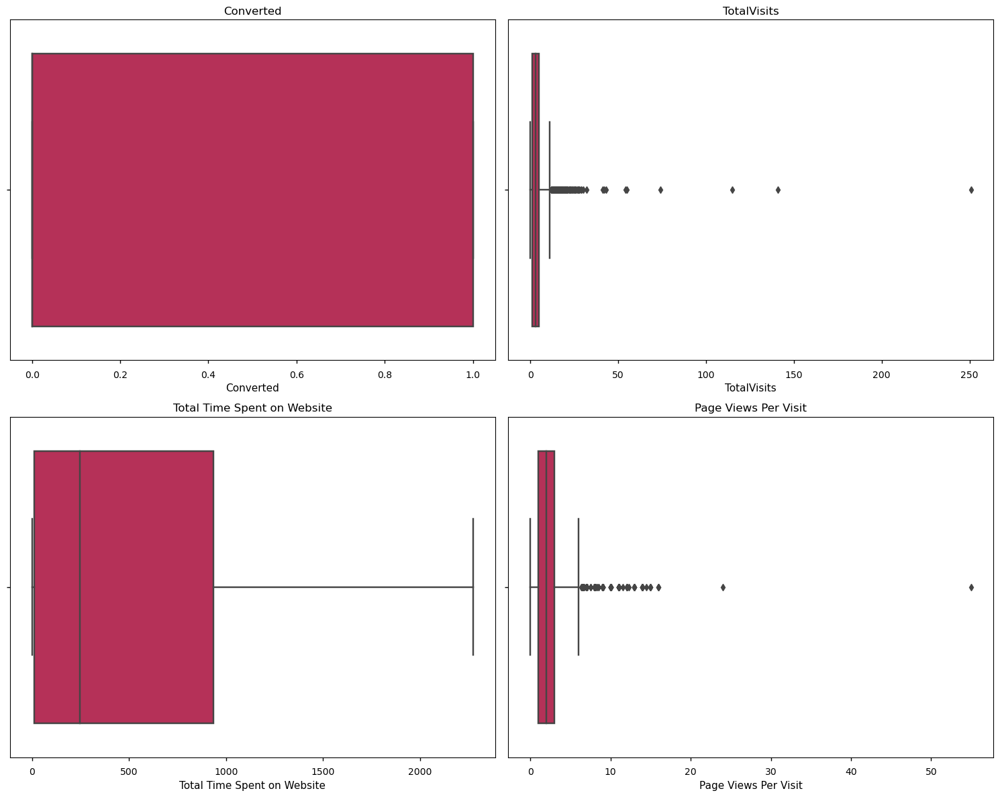

In [78]:
#  Plotting Boxplots for Outlier Analysis
a = 2  # number of rows
b = 2  # number of columns
c = 1 

fig = plt.figure(figsize=(15,12))

for col in leads.columns:
    if leads[col].dtypes!="object":
        plt.subplot(a, b, c)
        plt.title('{}'.format(col))
        plt.xlabel(col)
        sns.boxplot(leads[col],palette='rocket')
        c = c + 1

fig.tight_layout()
plt.show()

The following columns have outliers:
 - Page Views Per Visit
 - TotalVisits

Total Time spent on Website doesnot have any outliers.

#### Outlier Removal

In [79]:
# Outliers in the numerical columns and their removal
col_outlier = ['Page Views Per Visit','TotalVisits']
for col in col_outlier: 
    q1 = leads[col].quantile(0.25)
    q3 = leads[col].quantile(0.75)
    iqr = q3-q1
    range_low  = q1-1.5*iqr
    range_high = q3+1.5*iqr
    leads = leads.loc[(leads[col] > range_low) & (leads[col] < range_high)]

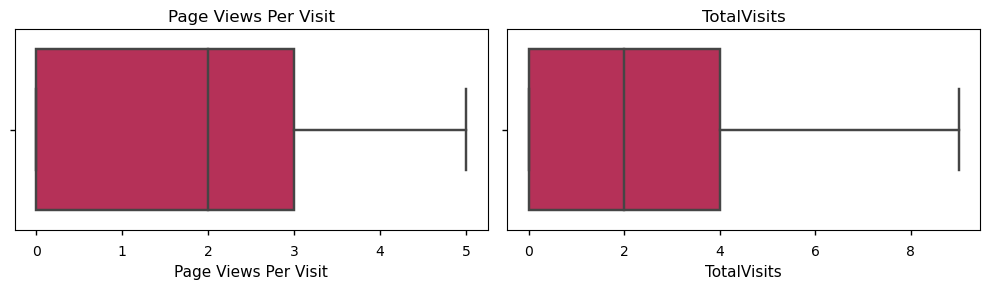

In [80]:
## Outlier analysis after removal of Outliers
a = 1  # number of rows
b = 2  # number of columns
c = 1 

fig = plt.figure(figsize=(10,3))

for col in col_outlier:
    plt.subplot(a, b, c)
    plt.title('{}'.format(col))
    plt.xlabel(col)
    sns.boxplot(leads[col],palette='rocket')
    c = c + 1

fig.tight_layout()
plt.show()

#### Inferences from the graph
- No Outliers for Page views per visit and TotalVisits after outliers removal


In [81]:
leads.shape

(8290, 16)

In [82]:
leads.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8290 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Lead Origin                             8290 non-null   object 
 1   Lead Source                             8290 non-null   object 
 2   Converted                               8290 non-null   int64  
 3   TotalVisits                             8290 non-null   float64
 4   Total Time Spent on Website             8290 non-null   int64  
 5   Page Views Per Visit                    8290 non-null   float64
 6   Last Activity                           8290 non-null   object 
 7   Country                                 8290 non-null   object 
 8   Specialization                          8290 non-null   object 
 9   How did you hear about X Education      8290 non-null   object 
 10  What is your current occupation         8290 non-null   obje

### Step 5:  Bivariate Analysis

In [83]:
## Creating 2 dataframes on the basis of Target Variable
leads0 = leads[leads['Converted']==0]
leads1 = leads[leads['Converted']==1]

Graph for :  Lead Origin


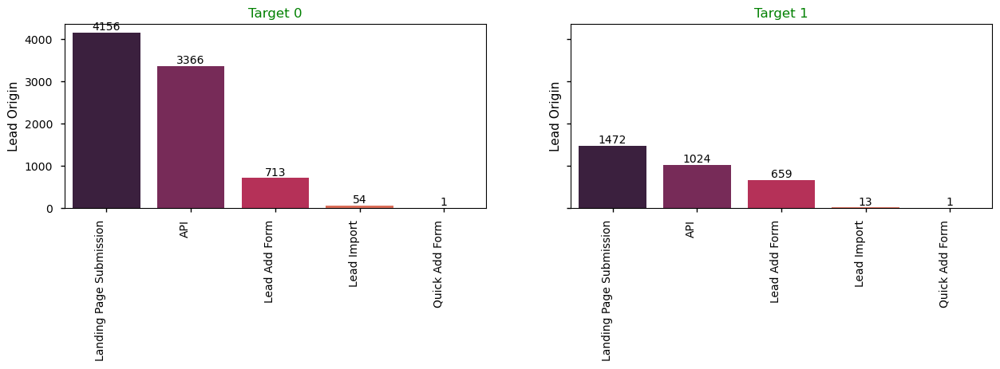

Graph for :  Lead Source


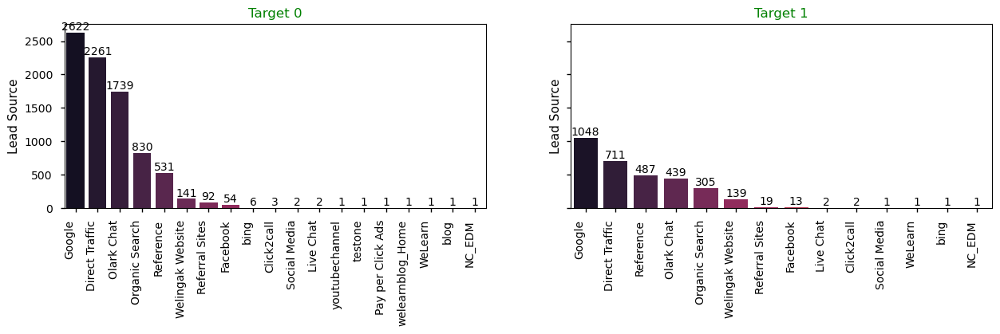

Graph for :  Last Activity


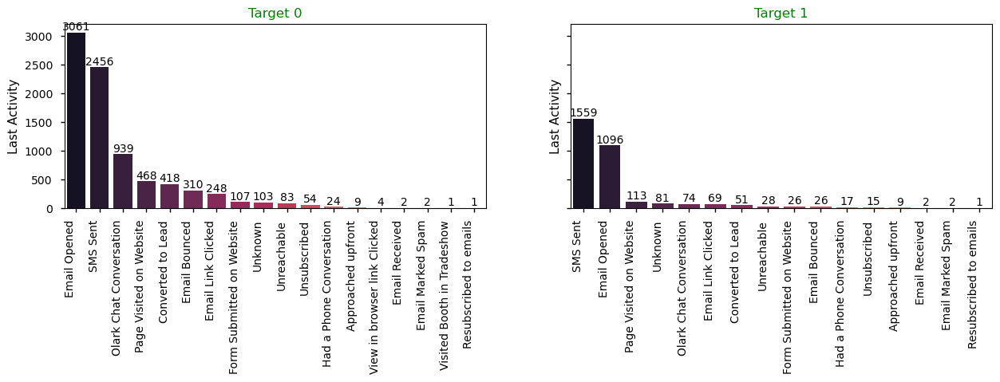

Graph for :  Country


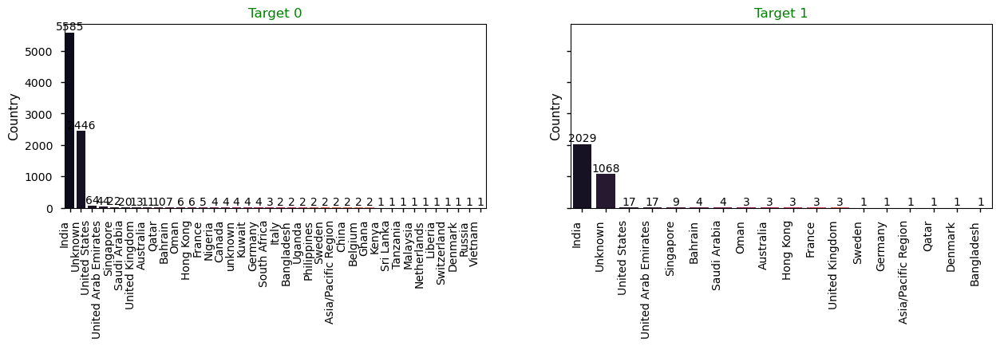

Graph for :  Specialization


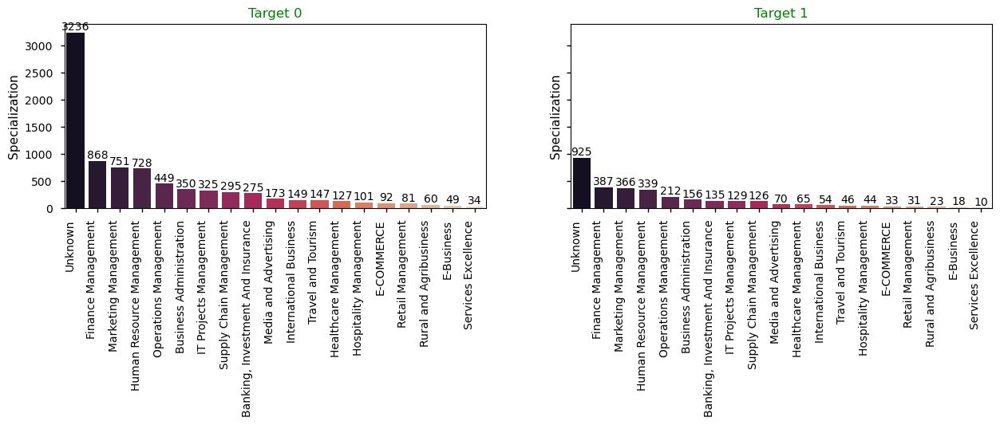

Graph for :  How did you hear about X Education


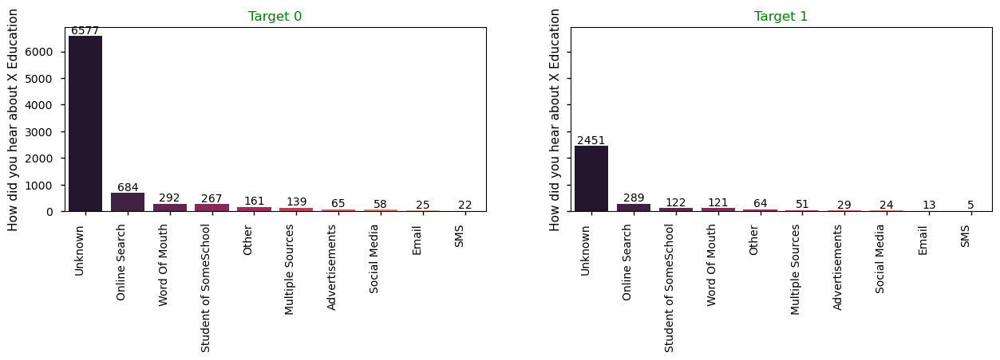

Graph for :  What is your current occupation


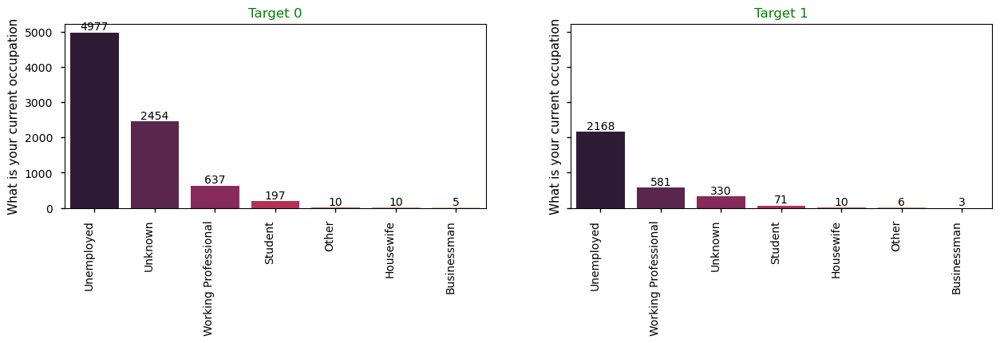

Graph for :  Tags


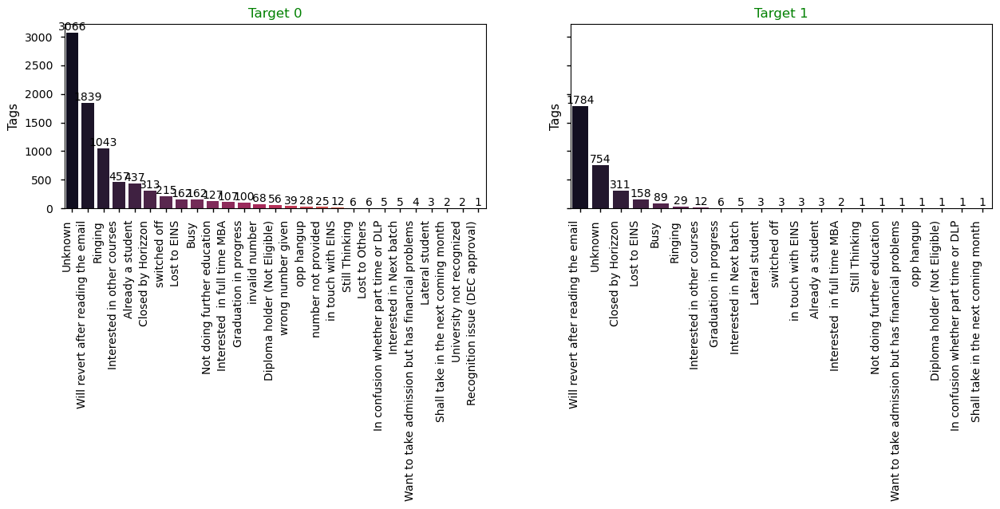

Graph for :  Lead Profile


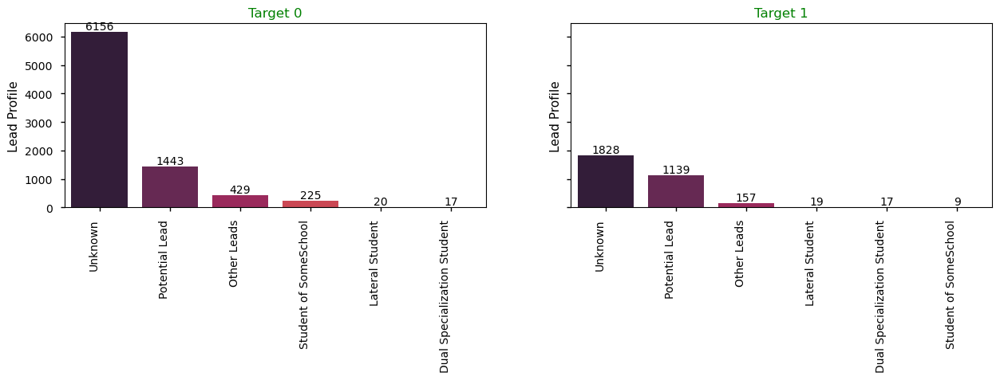

Graph for :  City


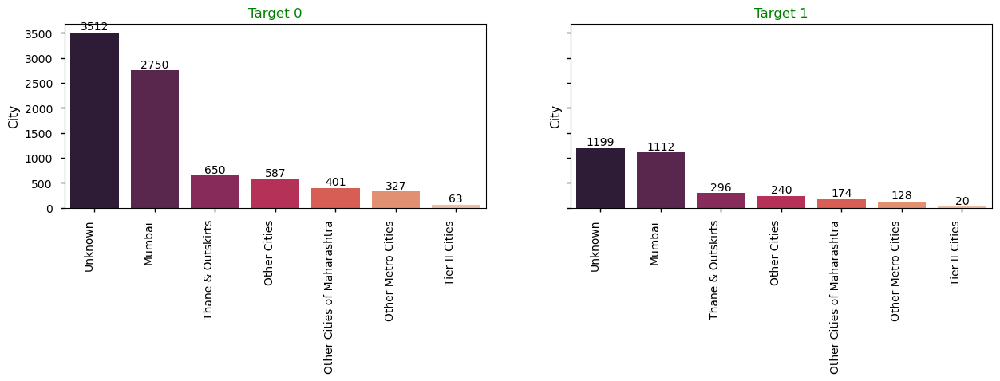

Graph for :  A free copy of Mastering The Interview


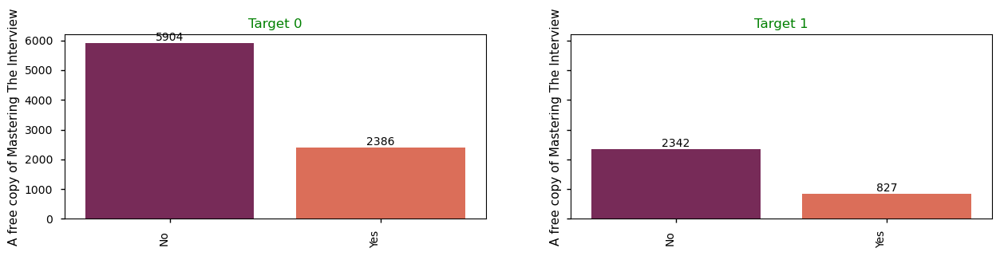

Graph for :  Last Notable Activity


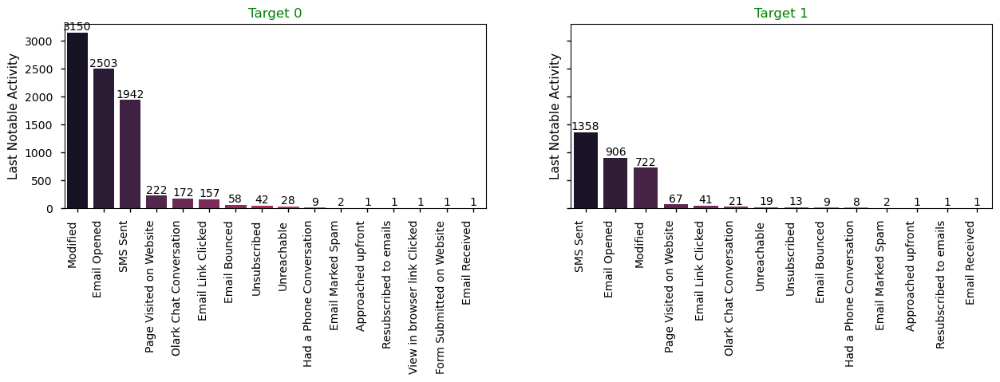

In [84]:
## Analysis for Object Datatypes
for col in leads.columns:
    if leads[col].dtypes=="object":
        cat_num0=leads[col].value_counts()
        f,(ax1,ax2) = plt.subplots(1,2,sharey=True,figsize=(15,3))
        print("Graph for : ",col)
        chart1=sns.barplot(x=cat_num0.index, y=cat_num0, ax=ax1, palette="rocket")
        chart1.set_xticklabels(chart1.get_xticklabels(minor=False), rotation=90, horizontalalignment='right')
        chart1.axes.set_title('Target 0',fontsize= 12,fontweight= 7,color='Green')
        chart1.bar_label(chart1.containers[-1])
        cat_num1=leads1[col].value_counts()
        chart2=sns.barplot(x=cat_num1.index, y=cat_num1,ax=ax2, palette="rocket")
        chart2.set_xticklabels(chart2.get_xticklabels(), rotation=90, horizontalalignment='right')
        chart2.axes.set_title('Target 1',fontsize= 12,fontweight= 7,color='Green')
        chart2.bar_label(chart2.containers[-1])
        plt.show()

#### Inferences from the graph
- For the leads which got converted, Lead origin was maximum  through Page submission and the least was Quick Add form
- For the leads which couldnt get converted , lead origin was maximum through Page submission and least through Quick Add form
- For Lead Source variable, maximum traffic is received via Google in case of both Lead Conversion and Lead Non-Conversion
- For Lead Non-Conversion Cases, the maximum Last Activity is Email Opened
- For Lead Conversion Cases, the maximum Last actibity is SMS Sent.

### Step 6: Multivariate Analysis

In [85]:
## Correlation Between Numberic Variables
leads.corr()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
Converted,1.000000,0.036612,0.344129,-0.004208
TotalVisits,0.036612,1.000000,0.396827,0.775114
Total Time Spent on Website,0.344129,0.396827,1.000000,0.407901
Page Views Per Visit,-0.004208,0.775114,0.407901,1.000000


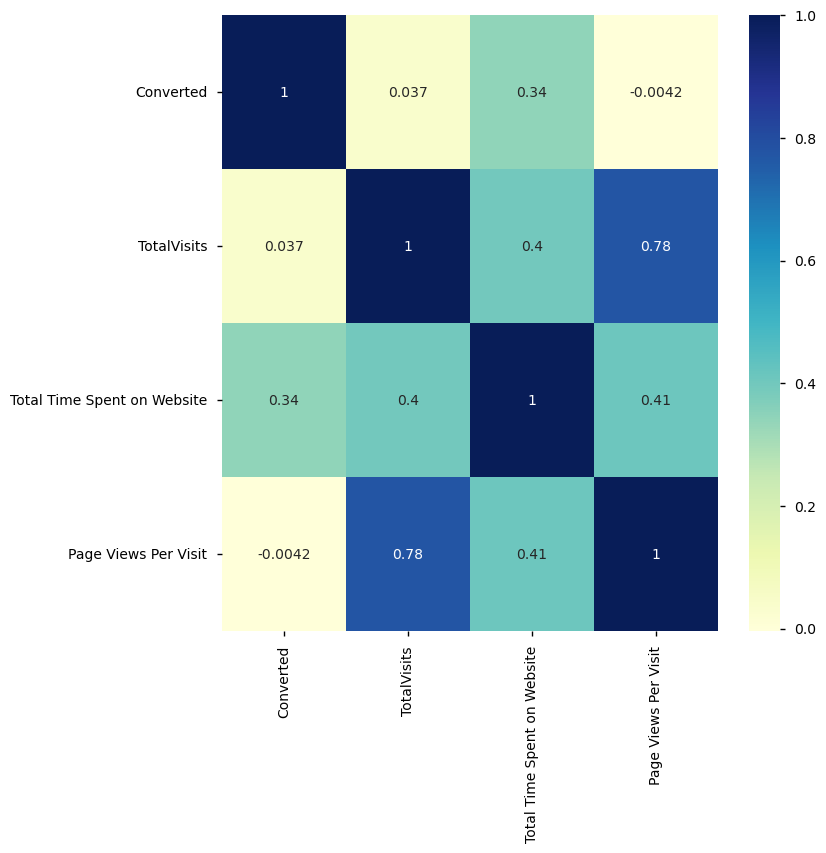

In [86]:
## heatmap in order to find out the coorelation between the variables
plt.figure(figsize=(8,8))

# heatmap
sns.heatmap(leads.corr(), cmap="YlGnBu", annot=True)
plt.show()

#### Inferences from the graph
- There is a strong correlation between Total Visits and Pages Views Per visit
- There is a correlation between Total Visits and Converted
- There is a negative correlation between Pages Views Per visit and Converted

### Step 7: Data Preparation 

In [87]:
leads.shape

(8290, 16)

In [88]:
leads.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8290 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Lead Origin                             8290 non-null   object 
 1   Lead Source                             8290 non-null   object 
 2   Converted                               8290 non-null   int64  
 3   TotalVisits                             8290 non-null   float64
 4   Total Time Spent on Website             8290 non-null   int64  
 5   Page Views Per Visit                    8290 non-null   float64
 6   Last Activity                           8290 non-null   object 
 7   Country                                 8290 non-null   object 
 8   Specialization                          8290 non-null   object 
 9   How did you hear about X Education      8290 non-null   object 
 10  What is your current occupation         8290 non-null   obje

#### Dummy Variable Creation

In [89]:
leads.nunique().sort_values()

Converted                                    2
A free copy of Mastering The Interview       2
Lead Origin                                  5
Lead Profile                                 6
What is your current occupation              7
City                                         7
TotalVisits                                 10
How did you hear about X Education          10
Last Notable Activity                       16
Last Activity                               18
Lead Source                                 19
Specialization                              19
Page Views Per Visit                        23
Tags                                        27
Country                                     38
Total Time Spent on Website               1668
dtype: int64

In [90]:
leads['Converted'].value_counts()

0    5121
1    3169
Name: Converted, dtype: int64

In [91]:
leads['A free copy of Mastering The Interview'].value_counts()

No     5904
Yes    2386
Name: A free copy of Mastering The Interview, dtype: int64

In [92]:
## Converting Binary Variables(Yes/No) to 0/1

#Define the map function:
def binary_map(x):
    return x.map({'Yes': 1, 'No' : 0})

#Applying Map Function:
leads[['A free copy of Mastering The Interview']] = leads[['A free copy of Mastering The Interview']].apply(binary_map)

In [93]:
## Analysis after mapping:
leads['A free copy of Mastering The Interview'].value_counts()

0    5904
1    2386
Name: A free copy of Mastering The Interview, dtype: int64

#### Creating Dummy Features for the categorical variables having multiple levels

In [94]:
leads['Lead Origin'].value_counts()

Landing Page Submission    4156
API                        3366
Lead Add Form               713
Lead Import                  54
Quick Add Form                1
Name: Lead Origin, dtype: int64

In [95]:
lead_dummy = pd.get_dummies(leads['Lead Origin'],prefix='Lead Origin')
leads = pd.concat([leads,lead_dummy],axis=1)
leads.drop(columns='Lead Origin',inplace=True)

In [96]:
leads.head()

,Lead Source,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form
0,Olark Chat,0,0.0,0,0.0,Page Visited on Website,Unknown,Unknown,Unknown,Unemployed,Interested in other courses,Unknown,Unknown,0,Modified,1,0,0,0,0
1,Organic Search,0,5.0,674,2.5,Email Opened,India,Unknown,Unknown,Unemployed,Ringing,Unknown,Unknown,0,Email Opened,1,0,0,0,0
2,Direct Traffic,1,2.0,1532,2.0,Email Opened,India,Business Administration,Unknown,Student,Will revert after reading ...,Potential Lead,Mumbai,1,Email Opened,0,1,0,0,0
3,Direct Traffic,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Ringing,Unknown,Mumbai,0,Modified,0,1,0,0,0
4,Google,1,2.0,1428,1.0,Converted to Lead,India,Unknown,Other,Unemployed,Will revert after reading ...,Unknown,Mumbai,0,Modified,0,1,0,0,0


In [97]:
leads['Lead Source'].value_counts()

Google               2622
Direct Traffic       2261
Olark Chat           1739
Organic Search        830
Reference             531
Welingak Website      141
Referral Sites         92
Facebook               54
bing                    6
Click2call              3
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: Lead Source, dtype: int64

In [98]:
## Mapping Small Counts as Others
leads['Lead Source'] = leads['Lead Source'].replace(['Facebook', 'bing', 'Click2call', 'Live Chat','Press_Release', 'Social Media', 'testone', 'WeLearn', 'blog','Pay per Click Ads', 'welearnblog_Home','youtubechannel', 'NC_EDM','Welingak Website','Referral Sites'],'Others')

In [99]:
leads['Lead Source'].value_counts()

Google            2622
Direct Traffic    2261
Olark Chat        1739
Organic Search     830
Reference          531
Others             307
Name: Lead Source, dtype: int64

In [100]:
lead_dummy1 = pd.get_dummies(leads['Lead Source'],prefix='Lead Source')
leads = pd.concat([leads,lead_dummy1],axis=1)
leads.drop(columns='Lead Source',inplace=True)

In [101]:
leads.head()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,Tags,Lead Profile,City,A free copy of Mastering The Interview,Last Notable Activity,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference
0,0,0.0,0,0.0,Page Visited on Website,Unknown,Unknown,Unknown,Unemployed,Interested in other courses,Unknown,Unknown,0,Modified,1,0,0,0,0,0,0,1,0,0,0
1,0,5.0,674,2.5,Email Opened,India,Unknown,Unknown,Unemployed,Ringing,Unknown,Unknown,0,Email Opened,1,0,0,0,0,0,0,0,1,0,0
2,1,2.0,1532,2.0,Email Opened,India,Business Administration,Unknown,Student,Will revert after reading ...,Potential Lead,Mumbai,1,Email Opened,0,1,0,0,0,1,0,0,0,0,0
3,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Ringing,Unknown,Mumbai,0,Modified,0,1,0,0,0,1,0,0,0,0,0
4,1,2.0,1428,1.0,Converted to Lead,India,Unknown,Other,Unemployed,Will revert after reading ...,Unknown,Mumbai,0,Modified,0,1,0,0,0,0,1,0,0,0,0


In [102]:
leads['Last Activity'].value_counts()

Email Opened                    3061
SMS Sent                        2456
Olark Chat Conversation          939
Page Visited on Website          468
Converted to Lead                418
Email Bounced                    310
Email Link Clicked               248
Form Submitted on Website        107
Unknown                          103
Unreachable                       83
Unsubscribed                      54
Had a Phone Conversation          24
Approached upfront                 9
View in browser link Clicked       4
Email Received                     2
Email Marked Spam                  2
Visited Booth in Tradeshow         1
Resubscribed to emails             1
Name: Last Activity, dtype: int64

In [103]:
## Mapping Small Counts as Others
leads['Last Activity'] = leads['Last Activity'].replace(['Form Submitted on Website','Unreachable','Unsubscribed','Had a Phone Conversation','Approached upfront','View in browser link Clicked','View in browser link Clicked','Email Received','Email Marked Spam','Visited Booth in Tradeshow', 'Visited Booth in Tradeshow','Resubscribed to emails'],'Others')

In [104]:
leads['Last Activity'].value_counts()

Email Opened               3061
SMS Sent                   2456
Olark Chat Conversation     939
Page Visited on Website     468
Converted to Lead           418
Email Bounced               310
Others                      287
Email Link Clicked          248
Unknown                     103
Name: Last Activity, dtype: int64

In [105]:
lead_dummy2 = pd.get_dummies(leads['Last Activity'],prefix='Last Activity')
leads = pd.concat([leads,lead_dummy2],axis=1)
leads.drop(columns='Last Activity',inplace=True)

In [106]:
## Also Dropping Last Activity_Unknown column as this value was added for NaN Value
leads.drop(columns='Last Activity_Unknown',inplace=True)

In [107]:
leads['Country'].value_counts()

India                   5585
Unknown                 2446
United States             64
United Arab Emirates      44
Singapore                 22
Saudi Arabia              20
United Kingdom            13
Australia                 11
Qatar                     10
Bahrain                    7
Oman                       6
Hong Kong                  6
France                     5
Nigeria                    4
Canada                     4
unknown                    4
Kuwait                     4
Germany                    4
South Africa               3
Italy                      2
Bangladesh                 2
Uganda                     2
Philippines                2
Sweden                     2
Asia/Pacific Region        2
China                      2
Belgium                    2
Ghana                      2
Kenya                      1
Sri Lanka                  1
Tanzania                   1
Malaysia                   1
Netherlands                1
Liberia                    1
Switzerland   

In [108]:
## Country Variable
def country(x):
    category = ""
    if x == "India":
        category = "India"
    elif x == "Unknown":
        category = "Unknown"
    else:
        category = "Outside India"
    return category

leads['Country'] = leads.apply(lambda x:country(x['Country']), axis = 1)

In [109]:
leads['Country'].value_counts()

India            5585
Unknown          2446
Outside India     259
Name: Country, dtype: int64

In [110]:
lead_dummy3 = pd.get_dummies(leads['Country'])
leads = pd.concat([leads,lead_dummy3],axis=1)
leads.drop(columns='Country',inplace=True)

In [111]:
leads.drop(columns='Unknown',inplace=True)

In [112]:
## Specialization Variable
leads['Specialization'].value_counts()

Unknown                              3236
Finance Management                    868
Marketing Management                  751
Human Resource Management             728
Operations Management                 449
Business Administration               350
IT Projects Management                325
Supply Chain Management               295
Banking, Investment And Insurance     275
Media and Advertising                 173
International Business                149
Travel and Tourism                    147
Healthcare Management                 127
Hospitality Management                101
E-COMMERCE                             92
Retail Management                      81
Rural and Agribusiness                 60
E-Business                             49
Services Excellence                    34
Name: Specialization, dtype: int64

In [113]:
## Mapping Small Counts as Others
leads['Specialization'] = leads['Specialization'].replace(['E-COMMERCE','Retail Management','Rural and Agribusiness','E-Business','Services Excellence'],'Others')

In [114]:
leads['Specialization'].value_counts()

Unknown                              3236
Finance Management                    868
Marketing Management                  751
Human Resource Management             728
Operations Management                 449
Business Administration               350
IT Projects Management                325
Others                                316
Supply Chain Management               295
Banking, Investment And Insurance     275
Media and Advertising                 173
International Business                149
Travel and Tourism                    147
Healthcare Management                 127
Hospitality Management                101
Name: Specialization, dtype: int64

In [115]:
lead_dummy4 = pd.get_dummies(leads['Specialization'],prefix='Specialization')
leads = pd.concat([leads,lead_dummy4],axis=1)
leads.drop(columns=['Specialization','Specialization_Unknown'],inplace=True)

In [116]:
## How did you hear about X Education Variable
leads['How did you hear about X Education'].value_counts()

Unknown                  6577
Online Search             684
Word Of Mouth             292
Student of SomeSchool     267
Other                     161
Multiple Sources          139
Advertisements             65
Social Media               58
Email                      25
SMS                        22
Name: How did you hear about X Education, dtype: int64

In [117]:
lead_dummy5 = pd.get_dummies(leads['How did you hear about X Education'],prefix='How')
leads = pd.concat([leads,lead_dummy5],axis=1)
leads.drop(columns=['How did you hear about X Education','How_Unknown'],inplace=True)

In [118]:
## What is your current occupation Variable
leads['What is your current occupation'].value_counts()

Unemployed              4977
Unknown                 2454
Working Professional     637
Student                  197
Other                     10
Housewife                 10
Businessman                5
Name: What is your current occupation, dtype: int64

In [119]:
## Mapping Small Counts as Others
leads['What is your current occupation'] = leads['What is your current occupation'].replace(['Other','Housewife','Businessman'],'Others')

In [120]:
lead_dummy6 = pd.get_dummies(leads['What is your current occupation'],prefix='Occupation')
leads = pd.concat([leads,lead_dummy6],axis=1)
leads.drop(columns=['What is your current occupation','Occupation_Unknown'],inplace=True)

In [121]:
## Tags variable
leads['Tags'].value_counts()

Unknown                                              3066
Will revert after reading the email                  1839
Ringing                                              1043
Interested in other courses                           457
Already a student                                     437
Closed by Horizzon                                    313
switched off                                          215
Lost to EINS                                          162
Busy                                                  162
Not doing further education                           127
Interested  in full time MBA                          107
Graduation in progress                                100
invalid number                                         68
Diploma holder (Not Eligible)                          56
wrong number given                                     39
opp hangup                                             28
number not provided                                    25
in touch with 

In [122]:
## Mapping Small Counts as Others
leads['Tags'] = leads['Tags'].replace(['Diploma holder (Not Eligible)','wrong number given','opp hangup','number not provided','number not provided','Still Thinking','Lost to Others','In confusion whether part time or DLP','in touch with EINS','Interested in Next batch','Interested in Next batch','Want to take admission but has financial problems','Lateral student','Lateral student','Shall take in the next coming month','Shall take in the next coming month','University not recognized','Recognition issue (DEC approval)'],'Others')

In [123]:
lead_dummy7 = pd.get_dummies(leads['Tags'],prefix='Tags')
leads = pd.concat([leads,lead_dummy7],axis=1)
leads.drop(columns=['Tags','Tags_Unknown'],inplace=True)

In [124]:
## Lead Profile Variable
leads['Lead Profile'].value_counts()

Unknown                        6156
Potential Lead                 1443
Other Leads                     429
Student of SomeSchool           225
Lateral Student                  20
Dual Specialization Student      17
Name: Lead Profile, dtype: int64

In [125]:
## Mapping Small Counts as Others
leads['Lead Profile'] = leads['Lead Profile'].replace(['Lateral Student','Dual Specialization Student'],'Other Leads')

In [126]:
lead_dummy7 = pd.get_dummies(leads['Lead Profile'],prefix='Profile')
leads = pd.concat([leads,lead_dummy7],axis=1)
leads.drop(columns=['Lead Profile','Profile_Unknown'],inplace=True)

In [127]:
## City Variable
leads['City'].value_counts()

Unknown                        3512
Mumbai                         2750
Thane & Outskirts               650
Other Cities                    587
Other Cities of Maharashtra     401
Other Metro Cities              327
Tier II Cities                   63
Name: City, dtype: int64

In [128]:
lead_dummy7 = pd.get_dummies(leads['City'],prefix='City')
leads = pd.concat([leads,lead_dummy7],axis=1)
leads.drop(columns=['City','City_Unknown'],inplace=True)

In [129]:
## Last Notable Activity Variable
leads['Last Notable Activity'].value_counts()

Modified                        3150
Email Opened                    2503
SMS Sent                        1942
Page Visited on Website          222
Olark Chat Conversation          172
Email Link Clicked               157
Email Bounced                     58
Unsubscribed                      42
Unreachable                       28
Had a Phone Conversation           9
Email Marked Spam                  2
Approached upfront                 1
Resubscribed to emails             1
View in browser link Clicked       1
Form Submitted on Website          1
Email Received                     1
Name: Last Notable Activity, dtype: int64

In [130]:
## Mapping Small Counts as Others
leads['Last Notable Activity'] = leads['Last Notable Activity'].replace(['Email Bounced','Unsubscribed','Unreachable','Had a Phone Conversation', 'Email Marked Spam','Approached upfront','Resubscribed to emails','View in browser link Clicked','Form Submitted on Website','Email Received'],'Others')

In [131]:
lead_dummy7 = pd.get_dummies(leads['Last Notable Activity'],prefix='Notable Activity')
leads = pd.concat([leads,lead_dummy7],axis=1)
leads.drop(columns=['Last Notable Activity'],inplace=True)

In [132]:
leads.shape

(8290, 82)

In [133]:
leads.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8290 entries, 0 to 9239
Data columns (total 82 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Converted                                         8290 non-null   int64  
 1   TotalVisits                                       8290 non-null   float64
 2   Total Time Spent on Website                       8290 non-null   int64  
 3   Page Views Per Visit                              8290 non-null   float64
 4   A free copy of Mastering The Interview            8290 non-null   int64  
 5   Lead Origin_API                                   8290 non-null   uint8  
 6   Lead Origin_Landing Page Submission               8290 non-null   uint8  
 7   Lead Origin_Lead Add Form                         8290 non-null   uint8  
 8   Lead Origin_Lead Import                           8290 non-null   uint8  
 9   Lead Origin_Quick A

## Test-train Split and Scaling

### Step 1: Test-Train Split

In [134]:
# Putting feature variable to X

X = leads.drop(['Converted'], axis=1)

X.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,India,Outside India,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Supply Chain Management,Specialization_Travel and Tourism,How_Advertisements,How_Email,How_Multiple Sources,How_Online Search,How_Other,How_SMS,How_Social Media,How_Student of SomeSchool,How_Word Of Mouth,Occupation_Others,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Graduation in progress,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Others,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Profile_Other Leads,Profile_Potential Lead,Profile_Student of SomeSchool,City_Mumbai,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Notable Activity_Email Link Clicked,Notable Activity_Email Opened,Notable Activity_Modified,Notable Activity_Olark Chat Conversation,Notable Activity_Others,Notable Activity_Page Visited on Website,Notable Activity_SMS Sent
0,0.0,0,0.0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,5.0,674,2.5,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,2.0,1532,2.0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0
3,1.0,305,1.0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
4,2.0,1428,1.0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0


In [135]:
X.shape

(8290, 81)

In [136]:
# Putting Target/Response variable to y

y = leads['Converted']

y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [137]:
y.shape

(8290,)

In [138]:
# Splittung the data into train and test data in the ration 70:30
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=101)

In [139]:
print(X_train.shape)
print(X_test.shape)

(5803, 81)
(2487, 81)


In [140]:
print(y_train.shape)
print(y_test.shape)

(5803,)
(2487,)


### Step 2: Feature Scaling

In [141]:
scaler = StandardScaler()
X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.fit_transform(X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']])
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,India,Outside India,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Supply Chain Management,Specialization_Travel and Tourism,How_Advertisements,How_Email,How_Multiple Sources,How_Online Search,How_Other,How_SMS,How_Social Media,How_Student of SomeSchool,How_Word Of Mouth,Occupation_Others,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Graduation in progress,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Others,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Profile_Other Leads,Profile_Potential Lead,Profile_Student of SomeSchool,City_Mumbai,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Notable Activity_Email Link Clicked,Notable Activity_Email Opened,Notable Activity_Modified,Notable Activity_Olark Chat Conversation,Notable Activity_Others,Notable Activity_Page Visited on Website,Notable Activity_SMS Sent
3452,-1.199776,-0.860146,-1.280646,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1787,0.658448,-0.801364,1.348644,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0
236,-1.199776,-0.860146,-1.280646,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1814,0.193892,0.534081,0.691322,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
8503,0.193892,0.695731,0.691322,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [142]:
## Conversion rate
conversion_rate = (sum(leads['Converted'])/len(leads['Converted'].index))*perc
print(conversion_rate)

38.22677925211097


`The conversion rate is approximately 38.23%. The date is not heavily class imbalanced.`

## Model Building

### Step 1: Feature elimination based on correlations

In [143]:
## Correlation between the variables:
leads.corr()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,India,Outside India,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Supply Chain Management,Specialization_Travel and Tourism,How_Advertisements,How_Email,How_Multiple Sources,How_Online Search,How_Other,How_SMS,How_Social Media,How_Student of SomeSchool,How_Word Of Mouth,Occupation_Others,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Graduation in progress,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Others,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Profile_Other Leads,Profile_Potential Lead,Profile_Student of SomeSchool,City_Mumbai,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Notable Activity_Email Link Clicked,Notable Activity_Email Opened,Notable Activity_Modified,Notable Activity_Olark Chat Conversation,Notable Activity_Others,Notable Activity_Page Visited on Website,Notable Activity_SMS Sent
Converted,1.000000,0.036612,0.344129,-0.004208,-0.046654,-0.132795,-0.057941,0.342143,-0.023583,0.013963,-0.085449,0.024392,-0.137647,-0.010157,0.081031,0.287944,-0.123414,-0.121029,-0.037598,-0.038126,-0.223192,-0.013186,-0.070881,0.337144,-0.056103,-0.038536,0.041412,0.027412,0.044747,0.033251,0.012198,0.053246,0.006092,-0.005527,0.068251,0.006717,0.044267,-0.007515,0.017729,-0.019173,0.011687,0.015588,-0.004128,0.024837,0.004416,-0.016453,0.005445,0.028028,0.012628,0.042751,-0.007019,0.134527,0.314556,-0.182237,0.048551,0.249203,-0.073281,-0.085555,-0.176959,0.172292,-0.096100,-0.093858,-0.276726,0.645864,-0.071540,-0.123675,0.016018,0.384554,-0.117644,0.032036,0.015106,0.023962,0.003824,0.043888,-0.011671,-0.034631,-0.027477,-0.246579,-0.077933,-0.001989,-0.027468,0.360825
TotalVisits,0.036612,1.000000,0.396827,0.775114,0.280069,-0.342965,0.502040,-0.281250,-0.046740,0.002141,0.163920,0.318377,-0.558705,0.255862,-0.071568,-0.232261,-0.085593,-0.054956,-0.029412,0.083020,-0.238221,0.059841,0.177471,0.033457,0.640426,0.058778,0.065753,0.082892,0.123977,0.032959,0.033875,0.096814,0.070763,0.074326,0.074958,0.081238,0.068869,0.078790,0.062784,0.069383,0.066118,0.043336,0.087697,0.217498,0.107213,0.031781,0.057932,0.119761,0.127285,0.006644,-0.027560,0.080557,-0.002515,-0.058305,0.059819,-0.014163,0.015908,0.005951,-0.012664,0.023886,-0.005262,0.016867,0.100070,0.061841,0.012151,0.052904,0.025493,0.007390,-0.048264,0.307904,0.096296,0.079373,0.081994,0.107169,0.023493,-0.016376,0.099105,-0.151021,-0.070429,0.023778,0.152458,0.029173
Total Time Spent on Website,0.344129,0.396827,1.000000,0.407901,0.171230,-0.206061,0.285356,-0.139811,-0.033223,0.035441,0.147313,0.224920,-0.391993,0.091572,-0.064353,-0.105934,0.000420,-0.021765,-0.039105,-0.001759,-0.198372,0.019821,0.035979,0.112608,0.428500,0.032381,0.032800,0.046028,0.082261,0.022907,0.043

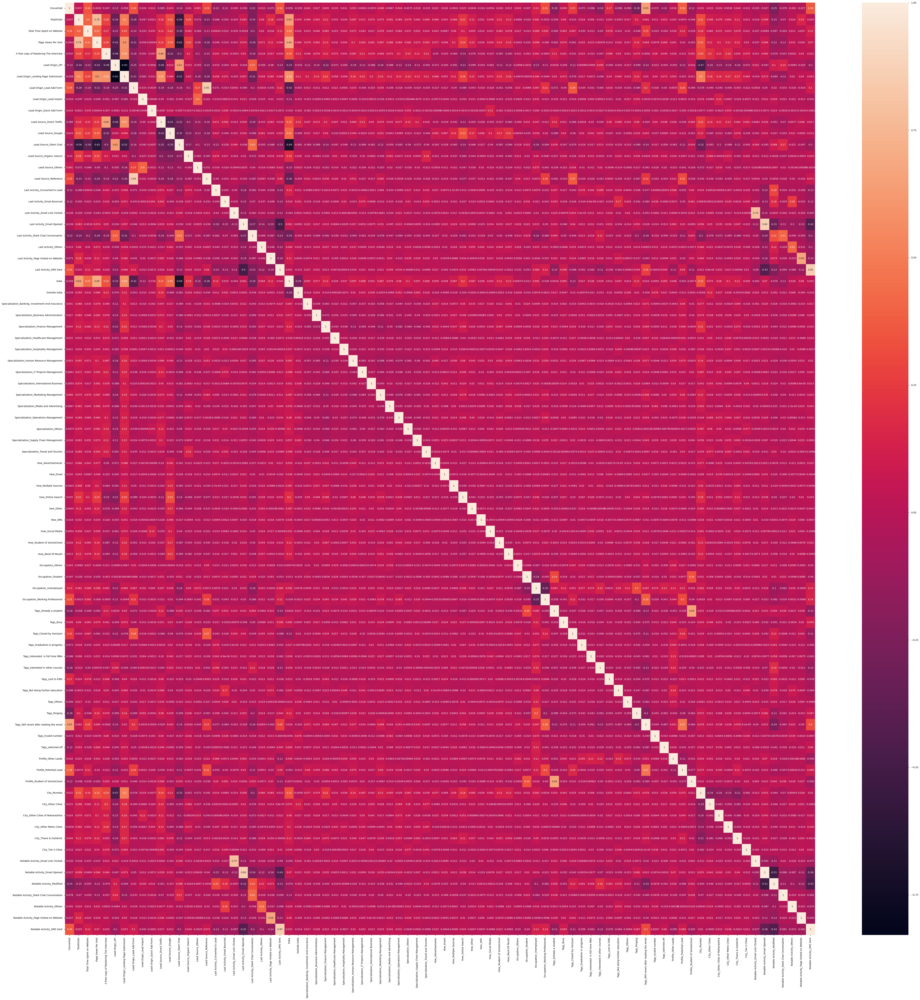

In [144]:
## Plotting a heatmap for the correlation
plt.figure(figsize=(70,70))
sns.heatmap(leads.corr(),annot=True)
plt.show()

After analysis of the heatmap the dummy following variables have high correlation ( Considering Absolute correlation > 0.8)
 - Lead Origin_API and Lead Origin_Landing Page Submission
 - Lead Origin_Lead Add Form and Lead Source_Reference
 - Notable Activity_Email Opened and Last Activity_Email Opened
 - Notable Activity_SMS Sent and Last Activity_SMS Sent
 
Dropping one variable from each pair

In [145]:
## Dropping Variable
X.drop(columns=['Lead Origin_Landing Page Submission','Lead Origin_Lead Add Form','Notable Activity_Email Opened','Notable Activity_SMS Sent'],inplace=True)
X_train.drop(columns=['Lead Origin_Landing Page Submission','Lead Origin_Lead Add Form','Notable Activity_Email Opened','Notable Activity_SMS Sent'],inplace=True)
X_test.drop(columns=['Lead Origin_Landing Page Submission','Lead Origin_Lead Add Form','Notable Activity_Email Opened','Notable Activity_SMS Sent'],inplace=True)

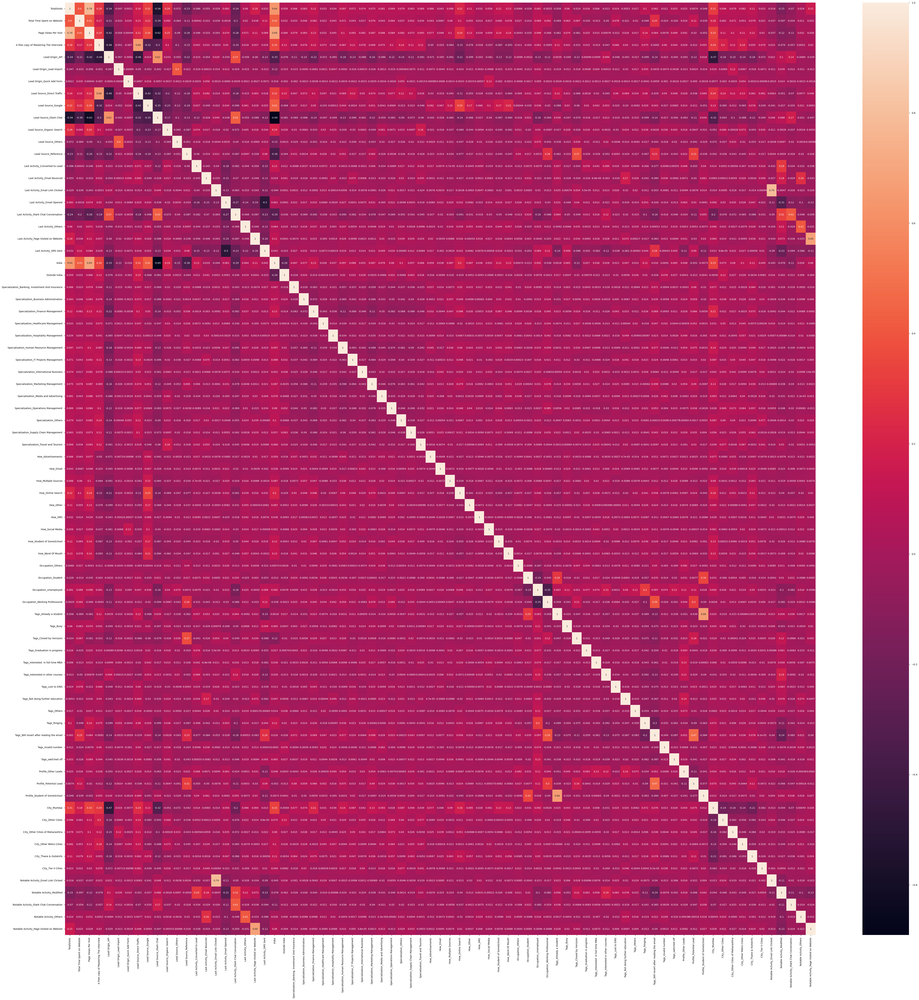

In [146]:
## Plotting Heatmap after dropping the variables
plt.figure(figsize=(70,70))
sns.heatmap(X.corr(),annot=True)
plt.show()

`Still there are many highly correlated variables present. But we will analyze and remove them at later stage.`

#### Running the First Training Model

In [147]:
## Logistic Regression Model
first_logm = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
first_logm.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 5803
Model:                            GLM   Df Residuals:                     5727
Model Family:                Binomial   Df Model:                           75
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -920.37
Date:                Sun, 21 May 2023   Deviance:                       1840.7
Time:                        16:50:07   Pearson chi2:                 9.90e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.6390
Covariance Type:            nonrobust                                         
====================================================================================================================
                                                       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------
const                                               -0.5245      0.797     -0.658      0.511      -2.088       1.038
TotalVisits                                          0.3075      0.108      2.852      0.004       0.096       0.519
Total Time Spent on Website                          1.1585      0.075     15.375      0.000       1.011       1.306
Page Views Per Visit                                -0.4322      0.125     -3.456      0.001      -0.677      -0.187
A free copy of Mastering The Interview              -0.2370      0.297     -0.797      0.425      -0.820       0.346
Lead Origin_API                                      0.1591      0.346      0.460      0.646      -0.519       0.838
Lead Origin_Lead Import                             -3.3748      0.832     -4.058      0.000      -5.005      -1.745
Lead Origin_Quick Add Form                       -8.253e-11   5.59e-08     -0.001      0.999    -1.1e-07    1.09e-07
Lead Source_Direct Traffic                           0.0938      0.285      0.329      0.742      -0.465       0.652
Lead Source_Google                                   0.1263      0.258      0.489      0.625      -0.380       0.632
Lead Source_Olark Chat                              -0.8136      0.364     -2.236      0.025      -1.527      -0.100
Lead Source_Organic Search                           0.2387      0.295      0.809      0.418      -0.339       0.817
Lead Source_Others                                   1.0283      0.358      2.869      0.004       0.326       1.731
Lead Source_Reference                               -1.1980      0.448     -2.672      0.008      -2.077      -0.319
Last Activity_Converted to Lead                     -0.3455      1.003     -0.344      0.731      -2.312       1.621
Last Activity_Email Bounced                         -2.3190      1.060     -2.188      0.029      -4.396      -0.242
Last Activity_Email Link Clicked                     1.0505      1.107      0.949      0.343      -1.120       3.221
Last Activity_Email Opened                          -0.1937      0.937     -0.207      0.836      -2.031       1.643
Last Activity_Olark Chat Conversation               -0.7023      0.962     -0.730      0.465      -2.587       1.183
Last Activity_Others                                -0.2695      1.031     -0.261      0.794      -2.290       1.751
Last Activity_Page Visited on Website               -0.3212      1.030     -0.312      0.755      -2.340       1.698
Last Activity_SMS Sent                               2.0728      0.938      2.210      0.027       0.235       3.911
India                                               -2.1216      0.444     -4.781      0.000      -2.991      -1.252
Outside India                            

### Step 2 : Feature selection using RFE (Coarse Tuning)

In [148]:
logreg = LogisticRegression()

In [149]:
## Running RFE with 15 variables as output
rfe = RFE(logreg,n_features_to_select = 15)   
rfe = rfe.fit(X_train, y_train)

In [150]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('TotalVisits', False, 35),
 ('Total Time Spent on Website', False, 10),
 ('Page Views Per Visit', False, 34),
 ('A free copy of Mastering The Interview', False, 29),
 ('Lead Origin_API', False, 62),
 ('Lead Origin_Lead Import', False, 5),
 ('Lead Origin_Quick Add Form', False, 63),
 ('Lead Source_Direct Traffic', False, 47),
 ('Lead Source_Google', False, 61),
 ('Lead Source_Olark Chat', False, 33),
 ('Lead Source_Organic Search', False, 52),
 ('Lead Source_Others', False, 6),
 ('Lead Source_Reference', False, 32),
 ('Last Activity_Converted to Lead', False, 37),
 ('Last Activity_Email Bounced', False, 11),
 ('Last Activity_Email Link Clicked', False, 22),
 ('Last Activity_Email Opened', False, 54),
 ('Last Activity_Olark Chat Conversation', False, 19),
 ('Last Activity_Others', False, 48),
 ('Last Activity_Page Visited on Website', False, 36),
 ('Last Activity_SMS Sent', True, 1),
 ('India', False, 8),
 ('Outside India', False, 9),
 ('Specialization_Banking, Investment And Insurance

In [151]:
cols_true = X_train.columns[rfe.support_]
cols_true

Index(['Last Activity_SMS Sent', 'Occupation_Unemployed',
       'Occupation_Working Professional', 'Tags_Already a student',
       'Tags_Closed by Horizzon', 'Tags_Graduation in progress',
       'Tags_Interested  in full time MBA', 'Tags_Interested in other courses',
       'Tags_Lost to EINS', 'Tags_Not doing further education', 'Tags_Others',
       'Tags_Ringing', 'Tags_Will revert after reading the email',
       'Tags_invalid number', 'Tags_switched off'],
      dtype='object')

In [152]:
# Displaying columns which are not selected by RFE:-

X_train.columns[~rfe.support_]

Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'A free copy of Mastering The Interview', 'Lead Origin_API',
       'Lead Origin_Lead Import', 'Lead Origin_Quick Add Form',
       'Lead Source_Direct Traffic', 'Lead Source_Google',
       'Lead Source_Olark Chat', 'Lead Source_Organic Search',
       'Lead Source_Others', 'Lead Source_Reference',
       'Last Activity_Converted to Lead', 'Last Activity_Email Bounced',
       'Last Activity_Email Link Clicked', 'Last Activity_Email Opened',
       'Last Activity_Olark Chat Conversation', 'Last Activity_Others',
       'Last Activity_Page Visited on Website', 'India', 'Outside India',
       'Specialization_Banking, Investment And Insurance',
       'Specialization_Business Administration',
       'Specialization_Finance Management',
       'Specialization_Healthcare Management',
       'Specialization_Hospitality Management',
       'Specialization_Human Resource Management',
       'Specialization_IT

#### User Defined Functions for Model Buliding

In [153]:
# Model buliding Function 
def model(cols):
    x_sm_train = sm.add_constant(X_train[cols])
    log_model = sm.GLM(y_train, x_sm_train, family = sm.families.Binomial()).fit()
    print(log_model.summary())
    return log_model

In [154]:
def predict(cols,res):
    x_sm_train = sm.add_constant(X_train[cols])
    y_train_pred = res.predict(x_sm_train)
    y_train_pred = y_train_pred.values.reshape(-1)
    y_train_pred_final = pd.DataFrame({'Conversion': y_train.values, 'Conversion_Probability':y_train_pred})
    y_train_pred_final['Lead Index'] = y_train.index
    y_train_pred_final['Predicted']= y_train_pred_final.Conversion_Probability.map(lambda x: 1 if x > 0.5 else 0)
    return y_train_pred_final

In [155]:
def confusion(y_train_pred_final):
    confusion = metrics.confusion_matrix(y_train_pred_final.Conversion, y_train_pred_final.Predicted)
    return confusion

In [156]:
def accuracy(y_train_pred_final):
    accuracy = metrics.accuracy_score(y_train_pred_final.Conversion, y_train_pred_final.Predicted)
    return accuracy

In [157]:
def vif_calculate(cols):
    x_train_cols = X_train[cols]
    vif = pd.DataFrame()
    vif['Features'] = x_train_cols.columns
    vif['VIF'] = [variance_inflation_factor(x_train_cols.values, i) for i in range(x_train_cols.shape[1])]
    vif['VIF'] = round(vif['VIF'],2)
    print(vif.sort_values(by='VIF',ascending=False))

#### Assessing the model with StatsModels

In [158]:
lm = model(cols_true)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 5803
Model:                            GLM   Df Residuals:                     5787
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1232.7
Date:                Sun, 21 May 2023   Deviance:                       2465.3
Time:                        16:50:13   Pearson chi2:                 8.42e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5980
Covariance Type:            nonrobust                                         
                                               coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [159]:
lm_pred = predict(cols_true,lm)

In [160]:
lm_pred[:10]

,Conversion,Conversion_Probability,Lead Index,Predicted
0,1,0.874437,3452,1
1,0,0.006225,1787,0
2,0,0.007489,236,0
3,0,0.021726,1814,0
4,0,0.059993,8503,0
5,1,0.995238,5154,1
6,1,0.995529,4068,1
7,0,0.007489,2552,0
8,0,0.000568,7075,0
9,0,0.007505,6765,0


In [161]:
accuracy(lm_pred)

0.9131483715319663

In [162]:
confusion(lm_pred)

array([[3464,   85],
       [ 419, 1835]], dtype=int64)

`The accuaracy of model is pretty high but P-value for Tags_invalid number column is 0.999. So, this column needs to be dropped`

### Step 3: Manual feature elimination (using p-values and VIFs)

In [163]:
cols_true2 = cols_true.drop('Tags_invalid number')

#### Model 2:

In [164]:
## Building Model again after dropping Column
lm2 = model(cols_true2)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 5803
Model:                            GLM   Df Residuals:                     5788
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1281.1
Date:                Sun, 21 May 2023   Deviance:                       2562.2
Time:                        16:50:14   Pearson chi2:                 7.84e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5912
Covariance Type:            nonrobust                                         
                                               coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

`The P-values for this model are 0.000`

In [165]:
lm_pred2 = predict(cols_true2,lm2)

In [166]:
lm_pred2[:10]

,Conversion,Conversion_Probability,Lead Index,Predicted
0,1,0.840983,3452,1
1,0,0.006292,1787,0
2,0,0.007938,236,0
3,0,0.022067,1814,0
4,0,0.059153,8503,0
5,1,0.994512,5154,1
6,1,0.995323,4068,1
7,0,0.007938,2552,0
8,0,0.000720,7075,0
9,0,0.007692,6765,0


In [167]:
## Accuracy for this model
accuracy(lm_pred2)

0.9103911769774254

In [168]:
## Confusion Matrix
confusion(lm_pred2)

array([[3448,  101],
       [ 419, 1835]], dtype=int64)

In [169]:
## Calculating Vif for this model
vif_calculate(cols_true2)

                         Features   VIF
4         Tags_Closed by Horizzon  1.32
13              Tags_switched off  1.19
10                    Tags_Others  1.18
9   Tags_Not doing further edu...  1.12
6   Tags_Interested  in full t...  1.10
5     Tags_Graduation in progress  1.08
8               Tags_Lost to EINS  1.07
2   Occupation_Working Profess...  0.83
11                   Tags_Ringing  0.54
7   Tags_Interested in other c...  0.25
1           Occupation_Unemployed  0.24
3          Tags_Already a student  0.22
0          Last Activity_SMS Sent  0.20
12  Tags_Will revert after rea...  0.05


`The VIF is also in acceptable range.`

`Thus, we can go ahead with Model Evaluation for this model.`

## Model Evaluation

### Step 1 : Accuracy

In [170]:
## Accuracy Score for the model 2
accuracy(lm_pred2)

0.9103911769774254

In [171]:
## Confusion Matrix
confusion = confusion(lm_pred2)

In [172]:
confusion

array([[3448,  101],
       [ 419, 1835]], dtype=int64)

### Step 2: Sensitivity and Specificity

In [173]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [174]:
## Sensitivity Calculation
sensitivity = TP / float(TP+FN)
sensitivity

0.8141082519964508

In [175]:
## Specificity Calculation
specificity = TN / (TN+FP)
specificity

0.9715412792335869

In [176]:
## False positive rate  - predicting conversion when customer have not converted
FP/float(TN+FP)

0.028458720766413075

In [177]:
## Positive Predictive Value
TP/float(TP+FP)

0.9478305785123967

In [178]:
## Negative Predictive Value
TN / float(TN+FN)

0.8916472717869149

### Step 3: Optimal cut-off using ROC curve

#### Plotting ROC Curve

In [179]:
## Defining the function to plot the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [180]:
fpr,tpr,thresholds = metrics.roc_curve(lm_pred2.Conversion,lm_pred2.Conversion_Probability)

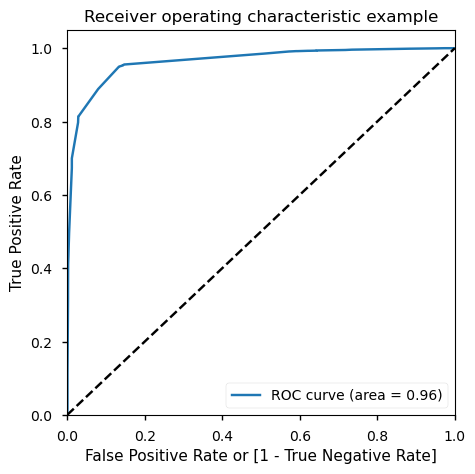

In [181]:
draw_roc(lm_pred2.Conversion,lm_pred2.Conversion_Probability)

#### Finding Optimal Cutoff Point

In [182]:
# Let's create columns with different probability cutoffs :-
y_train_pred_final = lm_pred2
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Conversion_Probability.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Conversion,Conversion_Probability,Lead Index,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.840983,3452,1,1,1,1,1,1,1,1,1,1,0
1,0,0.006292,1787,0,1,0,0,0,0,0,0,0,0,0
2,0,0.007938,236,0,1,0,0,0,0,0,0,0,0,0
3,0,0.022067,1814,0,1,0,0,0,0,0,0,0,0,0
4,0,0.059153,8503,0,1,0,0,0,0,0,0,0,0,0


In [183]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Conversion, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.388420  1.000000  0.000000
0.1   0.1  0.891952  0.955634  0.851507
0.2   0.2  0.898845  0.949867  0.866441
0.3   0.3  0.899018  0.948536  0.867568
0.4   0.4  0.907979  0.888642  0.920259
0.5   0.5  0.910391  0.814108  0.971541
0.6   0.6  0.910391  0.814108  0.971541
0.7   0.7  0.910391  0.814108  0.971541
0.8   0.8  0.904187  0.797249  0.972105
0.9   0.9  0.875754  0.698758  0.988166


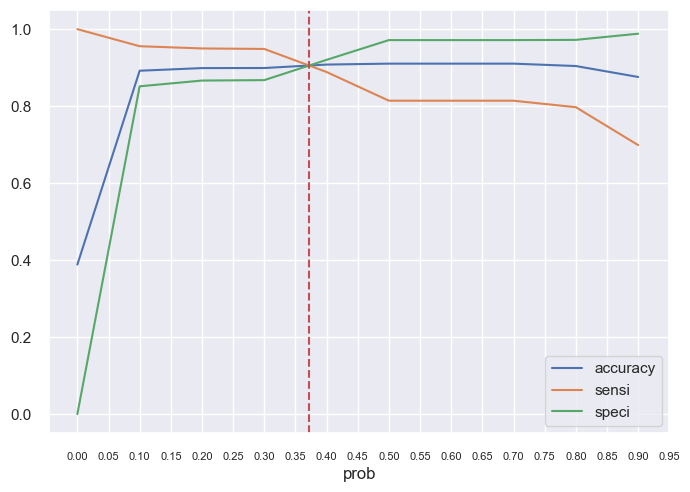

In [184]:
sns.set(style = 'darkgrid')
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.xticks(np.arange(0,1,step=0.05),size=8)
plt.axvline(x=0.372, color='r', linestyle='--') # additing axline
plt.show()

`The Optimal Cutoff value is 0.372.`

### Step 4 : Precision and Recall

In [185]:
## confusion matrix
confusion 

array([[3448,  101],
       [ 419, 1835]], dtype=int64)

In [186]:
precision = confusion[1,1]/( confusion[0,1] + confusion[1,1])
precision

0.9478305785123967

In [187]:
recall = confusion[1,1]/( confusion[1,0] + confusion[1,1])
recall

0.8141082519964508

In [188]:
precision_score(lm_pred2.Conversion ,lm_pred2.Predicted)

0.9478305785123967

In [189]:
recall_score(lm_pred2.Conversion ,lm_pred2.Predicted)

0.8141082519964508

In [190]:
p, r, thresholds = precision_recall_curve(lm_pred2.Conversion,lm_pred2.Conversion_Probability)

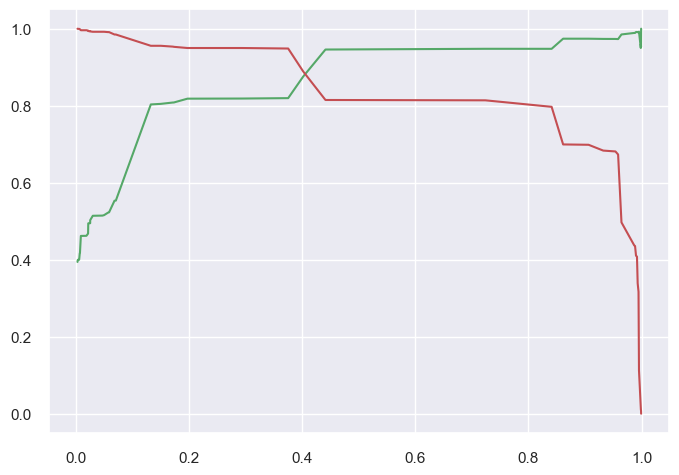

In [191]:
plt.plot(thresholds, p[:-1],'g-')
plt.plot(thresholds, r[:-1],'r-')
plt.show()

## Predictions on the Test Dataset

In [192]:
X_test[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.transform(X_test[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']])
X_test.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_API,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,India,Outside India,"Specialization_Banking, Investment And Insurance",Specialization_Business Administration,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Others,Specialization_Supply Chain Management,Specialization_Travel and Tourism,How_Advertisements,How_Email,How_Multiple Sources,How_Online Search,How_Other,How_SMS,How_Social Media,How_Student of SomeSchool,How_Word Of Mouth,Occupation_Others,Occupation_Student,Occupation_Unemployed,Occupation_Working Professional,Tags_Already a student,Tags_Busy,Tags_Closed by Horizzon,Tags_Graduation in progress,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Others,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Profile_Other Leads,Profile_Potential Lead,Profile_Student of SomeSchool,City_Mumbai,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Notable Activity_Email Link Clicked,Notable Activity_Modified,Notable Activity_Olark Chat Conversation,Notable Activity_Others,Notable Activity_Page Visited on Website
5871,2.981227,1.544391,1.677306,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
6498,-0.270664,0.150164,0.033999,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0
2932,-1.199776,-0.860146,-1.280646,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4809,0.658448,0.932694,1.348644,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6295,-1.199776,-0.860146,-1.280646,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [193]:
X_test = X_test[cols_true2]
X_test.head()

,Last Activity_SMS Sent,Occupation_Unemployed,Occupation_Working Professional,Tags_Already a student,Tags_Closed by Horizzon,Tags_Graduation in progress,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Others,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off
5871,0,1,0,0,0,0,0,0,0,0,0,1,0,0
6498,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2932,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4809,1,1,0,0,0,0,0,0,0,0,0,0,0,0
6295,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [194]:
X_test_sm = sm.add_constant(X_test)

In [195]:
y_test_pred = lm2.predict(X_test_sm)

In [196]:
y_test_pred[:10]

5871    0.007938
6498    0.000720
2932    0.991790
4809    0.840983
6295    0.402295
7998    0.050318
6422    0.840983
6535    0.007938
3074    0.995323
5670    0.375569
dtype: float64

In [197]:
## Converting the Y_test_pred into data frame
y_pred_1 = pd.DataFrame(y_test_pred)
y_pred_1

,0
5871,0.007938
6498,0.000720
2932,0.991790
4809,0.840983
6295,0.402295
...,...
407,0.022067
3357,0.071103
984,0.047396
2192,0.402295


In [198]:
# Converting y_test to dataframe:-
y_test_df = pd.DataFrame(y_test)

In [199]:
# Putting 'Lead Index'
y_test_df['Lead Index'] = y_test_df.index
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)
y_pred_final.head()

,Converted,Lead Index,0
5871,0,5871,0.007938
6498,0,6498,0.000720
2932,1,2932,0.991790
4809,1,4809,0.840983
6295,0,6295,0.402295


In [200]:
# Renaming the column '0' as 'Conversion_Probability':-
y_pred_final= y_pred_final.rename(columns={ 0 : 'Conversion_Probability'})
y_pred_final = y_pred_final[['Lead Index','Converted','Conversion_Probability']]

In [201]:
## Checking the data for y_pred_final
y_pred_final.head()

,Lead Index,Converted,Conversion_Probability
5871,5871,0,0.007938
6498,6498,0,0.000720
2932,2932,1,0.991790
4809,4809,1,0.840983
6295,6295,0,0.402295


In [202]:
#Assigning 'Lead Score' to dataframe 'y_pred_final':-

y_pred_final['Lead_Score'] = y_pred_final.Conversion_Probability.map( lambda x: round(x*perc))
y_pred_final.head()

,Lead Index,Converted,Conversion_Probability,Lead_Score
5871,5871,0,0.007938,1
6498,6498,0,0.000720,0
2932,2932,1,0.991790,99
4809,4809,1,0.840983,84
6295,6295,0,0.402295,40


In [203]:
## we use the sensitivity , specificity and accuracy cutoff , for this model it is 0.372
y_pred_final['final_Predicted'] = y_pred_final.Conversion_Probability.map(lambda x: 1 if x > 0.372 else 0)

In [204]:
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_Predicted)

0.895858464012867

In [205]:
confusion_test = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_Predicted )
confusion_test

array([[1362,  210],
       [  49,  866]], dtype=int64)

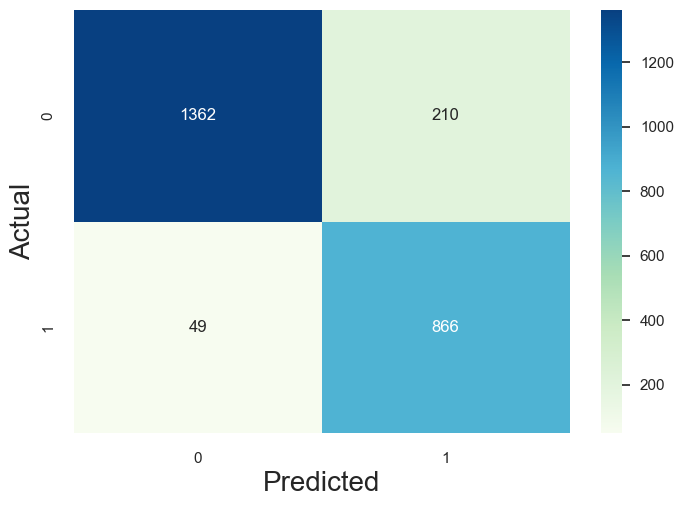

In [206]:
# Plotting confusion matrix:-
sns.heatmap(confusion_test, annot=True,fmt='g',cmap='GnBu')
plt.xlabel('Predicted',fontsize=20)
plt.ylabel('Actual',fontsize=20)
plt.show()

In [207]:
TP_test = confusion_test[1,1] # true positive 
TN_test = confusion_test[0,0] # true negatives
FP_test = confusion_test[0,1] # false positives
FN_test = confusion_test[1,0] # false negatives

In [208]:
##sensitivity of  logistic regression model
TP_test / float(TP_test+FN_test)

0.946448087431694

In [209]:
##specificity
TN_test / float(TN_test+FP_test)

0.8664122137404581

In [210]:
##False Postive Rate - predicting conversion when customer havenot converted
print(FP_test/ float(TN_test+FP_test))

0.13358778625954199


In [211]:
##positive predictive value
print (TP_test / float(TP_test+FP_test))

0.8048327137546468


In [212]:
##Negative predictive value

print (TN_test / float(TN_test+ FN_test))

0.9652728561304039


In [213]:
## 'precision_score':

precision_score(y_pred_final.Converted, y_pred_final.final_Predicted)

0.8048327137546468

In [214]:
## 'recall_score':

recall_score(y_pred_final.Converted, y_pred_final.final_Predicted)

0.946448087431694

#### Determining top feature based on final model

In [215]:
## displaying the parameters which are recevied in the final model
pd.options.display.float_format = '{:.2f}'.format # Setting format option
lm2.params[1:]

Last Activity_SMS Sent                      2.06
Occupation_Unemployed                       2.17
Occupation_Working Professional             2.33
Tags_Already a student                     -4.67
Tags_Closed by Horizzon                     5.19
Tags_Graduation in progress                -2.54
Tags_Interested  in full time MBA          -3.54
Tags_Interested in other courses           -3.40
Tags_Lost to EINS                           4.84
Tags_Not doing further education           -4.46
Tags_Others                                -3.23
Tags_Ringing                               -4.43
Tags_Will revert after reading the email    3.53
Tags_switched off                          -5.30
dtype: float64

In [216]:
#Getting a relative coeffient value for all the features wrt the feature with the highest coefficient:
top_feature = lm2.params[1:]
top_feature = 100.0 * (top_feature / top_feature.max())
top_feature

Last Activity_SMS Sent                       39.72
Occupation_Unemployed                        41.89
Occupation_Working Professional              44.98
Tags_Already a student                      -89.91
Tags_Closed by Horizzon                     100.00
Tags_Graduation in progress                 -48.98
Tags_Interested  in full time MBA           -68.23
Tags_Interested in other courses            -65.42
Tags_Lost to EINS                            93.23
Tags_Not doing further education            -86.01
Tags_Others                                 -62.18
Tags_Ringing                                -85.40
Tags_Will revert after reading the email     68.09
Tags_switched off                          -102.07
dtype: float64

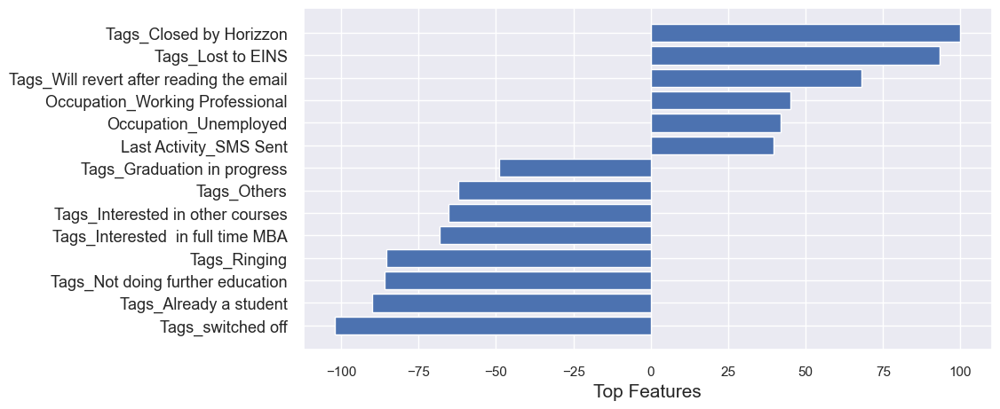

In [217]:
##Plotting the feature variables based on their relative importance:
top_feature_sort = np.argsort(top_feature,kind='quicksort',order='list of str')

pos = np.arange(top_feature_sort.shape[0]) + .5

fig1 = plt.figure(figsize=(10,5))
ax = fig1.add_subplot(1, 1, 1)
ax.barh(pos, top_feature[top_feature_sort])
ax.set_yticks(pos)
ax.set_yticklabels(np.array(X_train[cols_true2].columns)[top_feature_sort], fontsize=13)
ax.set_xlabel('Top Features', fontsize=15)
plt.show()

## Conclusion

### Final Observation

Evaluation Metrics for the train Dataset:
- Accuracy :0.91
- Sensitivity:~0.81
- Specificity:0.97
- Precision: 0.94
- Recall: 0.81
    
Evaluation Metrics for the test Dataset:

- Accuracy : 0.90
- Sensitivity: ~ 0.95
- Specificity: 0.87
- Precision: 0.80
- Recall: 0.95

### Recommendations
To improve the potential lead conversion rate, X-Education will have to mainly focus important features responsible for good conversion rate. Some of them are as follows:
- Occupation_Working Professional: The leads whose occupation is 'Working Professional' have higher lead conversion rate. The company should focus on working professionals and try to get more number of leads.

- Last Activity_SMS Sent: Leads whose last activity is sms sent can be potential leads for company.

- Occupation_Unemployed: The leads whose Occupation is 'Unemployed' have a good conversion rate. Company can target this feature to get more leads as in order to get employed people want to upskill themselves.

- Tags will revert after reading the mail - This feature also has a good Conversion rate . 
